In [2]:
!pip install torchdeq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.0/45.0 kB 4.6 MB/s eta 0:00:00


Shape of x_train (1, 512, 512, 2)
Shape of y_train (1, 512, 512, 3)
Model Parameters: 201,219
Img Size: 786,432
Compression ratio: 0.256


 20%|██        | 100/500 [00:37<02:51,  2.33it/s]

[Train] Loss: 0.00528, || PSNR: 29.02 || Lr: [0.009045180463377551]


 40%|████      | 200/500 [01:13<02:07,  2.34it/s]

[Train] Loss: 0.00348, || PSNR: 30.83 || Lr: [0.006545430463377552]


 60%|██████    | 300/500 [01:50<01:24,  2.35it/s]

[Train] Loss: 0.00289, || PSNR: 31.63 || Lr: [0.003455569536622448]


 80%|████████  | 400/500 [02:27<00:42,  2.34it/s]

[Train] Loss: 0.00271, || PSNR: 31.92 || Lr: [0.00095581953662245]


100%|██████████| 500/500 [03:03<00:00,  2.72it/s]


[Train] Loss: 0.00268, || PSNR: 31.96 || Lr: [1e-06]
Shape of x_train (1, 512, 512, 2)
Shape of y_train (1, 512, 512, 3)
Model Parameters: 201,219
Img Size: 786,432
Compression ratio: 0.256


 20%|██        | 100/500 [01:14<08:44,  1.31s/it]

[Train] Loss: 0.00320, || PSNR: 31.11 || Lr: [0.009045180463377551]


 40%|████      | 200/500 [02:30<08:06,  1.62s/it]

[Train] Loss: 0.00188, || PSNR: 33.43 || Lr: [0.006545430463377552]


 60%|██████    | 300/500 [03:45<05:30,  1.65s/it]

[Train] Loss: 0.00151, || PSNR: 34.36 || Lr: [0.003455569536622448]


 80%|████████  | 400/500 [05:00<02:43,  1.63s/it]

[Train] Loss: 0.00131, || PSNR: 34.98 || Lr: [0.00095581953662245]


100%|██████████| 500/500 [06:15<00:00,  1.33it/s]

[Train] Loss: 0.00127, || PSNR: 35.12 || Lr: [1e-06]


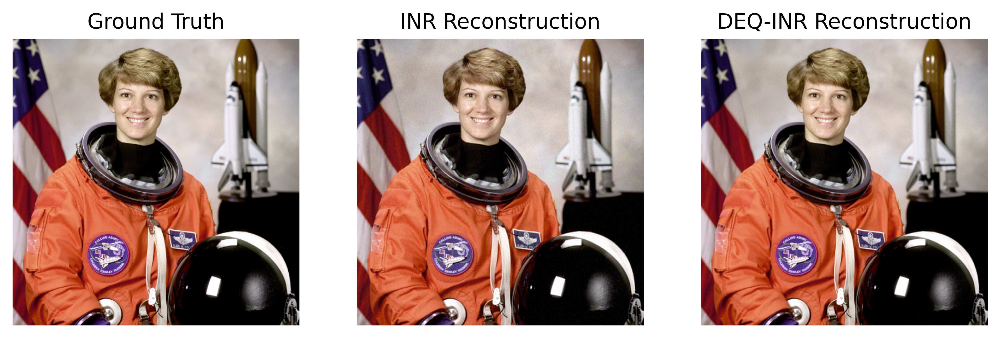

In [4]:
#PARENT PAPER ASTRONAUT

import numpy as np

import torch
import torch.nn as nn

from torchdeq import get_deq
from torchdeq.norm import apply_norm, reset_norm

######################################
#
# Linear Layers
#
######################################

class INRInjection(nn.Linear):
  def __init__(self, in_features, d_hidden, scale=256):
    super().__init__(in_features, d_hidden)
    self.weight.data *= scale
    self.bias.data.uniform_(-np.pi, np.pi)


class MFNLinear(nn.Linear):
  def __init__(self, d_hidden, scale=256):
    super().__init__(d_hidden, d_hidden)
    nn.init.uniform_(self.weight, -np.sqrt(1 / d_hidden), np.sqrt(1 / d_hidden))

######################################
#
# DEQ-INR Base class
#
######################################

class DEQINRBase(nn.Module):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__()

    self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
    self.mfn = nn.ModuleList([
        MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
    self.out = nn.Linear(d_hidden, d_out)

    self.d_hidden = d_hidden
    self.n_layer  = n_layer

    self.register_buffer('z_aux', self._init_z())
    self.deq_mode = deq_mode
    self.deq = get_deq(**kwargs)

    # This function automatically decorates weights in your DEQ layer
    # to have weight/spectral normalization. (for better stability)
    # Using norm_type='none' in `kwargs` can also skip it.
    apply_norm(self.mfn, **kwargs)

  def _init_z(self):
    raise NotImplemented

  def injection(self, x):
    raise NotImplemented

  def filter(self, z, u):
    raise NotImplemented

  def mfn_forward(self, z, u):
    # Fixed point reuse
    z = z + self.filter(self.z_aux, u[0])

    for i, layer in enumerate(self.mfn):
      z = self.filter(layer(z), u[i+1])

    return z

  def forward(self, x, z=None):
    reuse = True
    if z is None:
      z = torch.zeros(x.shape[0], self.d_hidden).to(x)
      reuse = False

    u = self.injection(x)

    reset_norm(self.mfn)
    f = lambda z: self.mfn_forward(z, u)
    if self.deq_mode:
      solver_kwargs = {'f_max_iter':0} if reuse else {}
      z_pred, info = self.deq(f, z, solver_kwargs=solver_kwargs)
    else:
      z_pred = [f(z)]

    outputs = [self.out(z) for z in z_pred]

    return outputs, z_pred[-1]

######################################
#
# DEQ-INR Instantiations by different filters
#
######################################

class DEQSirenINR(DEQINRBase):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

  def _init_z(self):
    return torch.zeros(1, self.d_hidden)

  def injection(self, x):
    u = self.inj(x)
    u = u.chunk(self.n_layer+1, dim=1)

    return u

  def filter(self, z, u):
    return torch.sin(z + u)


class DEQFourierINR(DEQINRBase):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

  def _init_z(self):
    return torch.ones(1, self.d_hidden)

  def injection(self, x):
    u = torch.sin(self.inj(x))
    u = u.chunk(self.n_layer+1, dim=1)

    return u

  def filter(self, z, u):
    return z * u


_model_class = {
  'Fourier': DEQFourierINR,
  'Siren': DEQSirenINR
}


def get_model(filter):
  assert filter in _model_class
  return _model_class[filter]

import skimage
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
from torchdeq.loss import fp_correction

# Normalize input np.array
# Convert np.array to tensor
def preprocess(x, normalize=False, device=None, dtype=None):
  if normalize:
      x = 2 * x - 1
  B, H, W, C = x.shape

  x = torch.tensor(x, device=device).float()
  return x.reshape(B*H*W, C)


# Convert tensor to np.array
# Clip min/max values
def postprocess(x):
  return torch.clip((x.detach() + 1)/2, 0, 1)


# Calculate PSNR
def PSNR(y_orig, y_pred):
  mse = torch.mean((y_orig - y_pred) ** 2)
  max_pixel = 1.0
  psnr = 20 * torch.log10(max_pixel / torch.sqrt(mse))
  return psnr.item()

def load_data(img, grid_size, device=None, show_img=True):
  # Load image
  if img == 'astronaut':
    image = skimage.data.astronaut()
    dataset = image.reshape(1, 512, 512, 3).astype(np.float32) / 255
  else:
    image = skimage.data.camera()
    dataset = image.reshape(1, 512, 512, 1).astype(np.float32) / 255

  data_channels = dataset.shape[-1]
  RES = image.shape[1]

  full_x = np.linspace(0, 1, RES) * 2 - 1
  full_x_grid = np.stack(np.meshgrid(full_x,full_x), axis=-1)[None, :, :]

  # Downsampling
  x_train_data = x_test_data = full_x_grid[:, ::RES // grid_size, ::RES // grid_size]
  y_train_data = y_test_data = dataset[:, ::RES // grid_size, ::RES // grid_size]
  print("Shape of x_train", x_train_data.shape)
  print("Shape of y_train", y_train_data.shape)

  # Visualize the image if requested
  if show_img:
    fig, ax = plt.subplots(1, 3, figsize=(10, 3))
    if img == 'astronaut':
      ax[0].imshow(y_train_data[0, :, :, :])
    else:
      ax[0].imshow(y_train_data[0, :, :, 0], cmap='gray')
    ax[0].set_title("image")
    ax[0].axis('off')
    ax[1].imshow(x_train_data[0, :, :, 0])
    ax[1].set_title("horizontal mesh_grid")
    ax[1].axis('off')
    ax[2].imshow(x_train_data[0, :, :, 1])
    ax[2].set_title("vertical mesh_grid")
    ax[2].axis('off')

  # Transform to tensors
  x_train = preprocess(x_train_data, device=device)
  y_train = preprocess(y_train_data, normalize=True, device=device)

  return x_train, y_train

def train(model, x_train, y_train, lr=1e-3, log_freq=100):
  # Compute compression rate
  n_params = sum(p.numel() for p in model.parameters())
  img_size = y_train.numel()
  print(f'Model Parameters: {n_params:,}')
  print(f'Img Size: {img_size:,}')
  print(f'Compression ratio: {n_params/img_size:.3f}')

  # Training loop
  optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0.0)
  scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)

  loss_log, psnr_log = [], []

  z_star = None
  for i in tqdm(range(epochs)):
    y_pred, z_pred = model(x_train, z_star)
    if deq_mode and reuse:
      z_star = z_pred.detach()

    # If you use trajectory sampling, fp_correction automatically
    # aligns the tensors and applies your loss function.
    loss_fn = lambda y_gt, y: ((y_gt - y) ** 2).mean()
    train_loss = fp_correction(loss_fn, (y_train, y_pred))

    train_loss.backward()
    optimizer.step()
    scheduler.step()

    loss_log.append(train_loss.item())

    train_psnr = PSNR(postprocess(y_train), postprocess(y_pred[-1]))
    psnr_log.append(train_psnr)
    if (i+1) % log_freq == 0:
      with torch.inference_mode():
        y_pred, _ = model(x_train)
      psnr = PSNR(postprocess(y_train), postprocess(y_pred[-1]))
      print(f"[Train] Loss: {train_loss.item():.5f}, || PSNR: {psnr:.2f} || Lr: {scheduler.get_last_lr()}")

    optimizer.zero_grad()
  return y_pred[-1], loss_log, psnr_log

def plot_training_stats(loss_log, psnr_log):
  fig, ax1 = plt.subplots()
  ax1.plot(loss_log, color='orange', label='Train Loss')
  ax1.set_xlabel("epoch")
  ax1.semilogy()

  ax2 = ax1.twinx()
  ax2.plot(psnr_log, color='b', label='PSNR')
  plt.title("training curve")

  ax1.legend(loc='best')
  ax2.legend(loc='best')

def visualize_results(y_orig, y_pred, grid_size=128):
  y_orig = postprocess(y_orig).detach().cpu().numpy()
  y_pred = postprocess(y_pred).detach().cpu().numpy()
  data_channels = y_orig.shape[-1]

  fig, ax = plt.subplots(1, 2, figsize=(10, 24))
  if data_channels == 1:
    ax[0].imshow(y_orig.reshape(grid_size, grid_size), cmap='gray')
    ax[1].imshow(y_pred.reshape(grid_size, grid_size), cmap='gray')
  else:
    ax[0].imshow(y_orig.reshape((grid_size, grid_size, data_channels)))
    ax[1].imshow(y_pred.reshape((grid_size, grid_size, data_channels)))

  ax[0].set_title("GT")
  ax[0].axis('off')
  ax[1].set_title("Reconstruction")
  ax[1].axis('off')

def visualize_triple_results(y_orig, exp_y_pred, imp_y_pred, grid_size=512, file_name=None):
    y_orig = postprocess(y_orig).detach().cpu().numpy()
    exp_y_pred = postprocess(exp_y_pred).detach().cpu().numpy()
    imp_y_pred = postprocess(imp_y_pred).detach().cpu().numpy()
    data_channels = y_orig.shape[-1]

    fig, ax = plt.subplots(1, 3, figsize=(10, 40), dpi=500)
    if data_channels == 1:
        ax[0].imshow(y_orig.reshape(grid_size, grid_size), cmap='gray')
        ax[1].imshow(exp_y_pred.reshape(grid_size, grid_size), cmap='gray')
        ax[2].imshow(imp_y_pred.reshape(grid_size, grid_size), cmap='gray')
    else:
        ax[0].imshow(y_orig.reshape((grid_size, grid_size, data_channels)))
        ax[1].imshow(exp_y_pred.reshape((grid_size, grid_size, data_channels)))
        ax[2].imshow(imp_y_pred.reshape((grid_size, grid_size, data_channels)))

    ax[0].set_title("Ground Truth")
    ax[0].axis('off')
    ax[1].set_title("INR Reconstruction")
    ax[1].axis('off')
    ax[2].set_title("DEQ-INR Reconstruction")
    ax[2].axis('off')

    # If a filename is provided, save the figure to a file.
    if file_name:
        plt.savefig(file_name, bbox_inches='tight', pad_inches=0.1)
    else:
        plt.show()

class DEQSirenINR(DEQINRBase):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

  def _init_z(self):
    return torch.zeros(1, self.d_hidden)

  def injection(self, x):
    u = self.inj(x)
    u = u.chunk(self.n_layer+1, dim=1)

    return u

  def filter(self, z, u):
    return torch.sin(z + u)


class DEQFourierINR(DEQINRBase):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

  def _init_z(self):
    return torch.ones(1, self.d_hidden)

  def injection(self, x):
    u = torch.sin(self.inj(x))
    u = u.chunk(self.n_layer+1, dim=1)

    return u

  def filter(self, z, u):
    return z * u


_model_class = {
  'Fourier': DEQFourierINR,
  'Siren': DEQSirenINR
}


def get_model(filter):
  assert filter in _model_class
  return _model_class[filter]
# Configs for INR
grid_size = 512
img = 'astronaut'

lr = 1e-2
epochs = 500

filter = 'Fourier'
d_hidden = 256
n_layer = 3
scale = 256.

deq_mode = False
reuse = False
ift = False
grad = 1
norm_type = 'none'

device = torch.device('cuda:0')
log_freq = 100

# Training a mini INR for image reconstruction!
Model = get_model(filter)

x_train, y_train = load_data(img, grid_size, device=device, show_img=False)
model = Model(d_in=2, d_out=y_train.shape[-1], d_hidden=d_hidden, n_layer=n_layer, scale=scale,
        deq_mode=deq_mode, ift=ift, grad=grad, norm_type=norm_type).to(device)

exp_y_pred, loss_log, psnr_log = train(model, x_train, y_train, lr=lr, log_freq=log_freq)


# Configs for DEQ-INR
grid_size = 512
img = 'astronaut'

lr = 1e-2
epochs = 500

filter = 'Fourier'
d_hidden = 256
n_layer = 3
scale = 128.

deq_mode = True
reuse = True
ift = False
grad = 5
norm_type = 'spectral_norm'


device = torch.device('cuda:0')
log_freq = 100

# Training a mini INR for image reconstruction!
Model = get_model(filter)

x_train, y_train = load_data(img, grid_size, device=device, show_img=False)
model = Model(d_in=2, d_out=y_train.shape[-1], d_hidden=d_hidden, n_layer=n_layer, scale=scale,
        deq_mode=deq_mode, ift=ift, grad=grad, norm_type=norm_type).to(device)

y_pred, loss_log, psnr_log = train(model, x_train, y_train, lr=lr, log_freq=log_freq)


# Visualize the reconstruction results
visualize_triple_results(y_train, exp_y_pred, y_pred, grid_size=grid_size, file_name='astronaut.png')

Shape of x_train (1, 512, 512, 2)
Shape of y_train (1, 512, 512, 1)
Model Parameters: 200,705
Img Size: 262,144
Compression ratio: 0.766


 20%|██        | 100/500 [00:36<03:01,  2.20it/s]

[Train] Loss: 0.00204, || PSNR: 32.95 || Lr: [0.009045180463377551]


 40%|████      | 200/500 [01:12<02:05,  2.39it/s]

[Train] Loss: 0.00164, || PSNR: 33.89 || Lr: [0.006545430463377552]


 60%|██████    | 300/500 [01:48<01:26,  2.32it/s]

[Train] Loss: 0.00151, || PSNR: 34.24 || Lr: [0.003455569536622448]


 80%|████████  | 400/500 [02:25<00:42,  2.34it/s]

[Train] Loss: 0.00147, || PSNR: 34.37 || Lr: [0.00095581953662245]


100%|██████████| 500/500 [03:01<00:00,  2.75it/s]


[Train] Loss: 0.00146, || PSNR: 34.40 || Lr: [1e-06]
Shape of x_train (1, 512, 512, 2)
Shape of y_train (1, 512, 512, 1)
Model Parameters: 200,705
Img Size: 262,144
Compression ratio: 0.766


 20%|██        | 100/500 [01:14<08:16,  1.24s/it]

[Train] Loss: 0.00352, || PSNR: 30.59 || Lr: [0.009045180463377551]


 40%|████      | 200/500 [02:28<08:11,  1.64s/it]

[Train] Loss: 0.00239, || PSNR: 32.27 || Lr: [0.006545430463377552]


 60%|██████    | 300/500 [03:44<05:29,  1.65s/it]

[Train] Loss: 0.00178, || PSNR: 33.52 || Lr: [0.003455569536622448]


 80%|████████  | 400/500 [04:59<02:44,  1.65s/it]

[Train] Loss: 0.00151, || PSNR: 34.24 || Lr: [0.00095581953662245]


100%|██████████| 500/500 [06:14<00:00,  1.33it/s]

[Train] Loss: 0.00147, || PSNR: 34.36 || Lr: [1e-06]


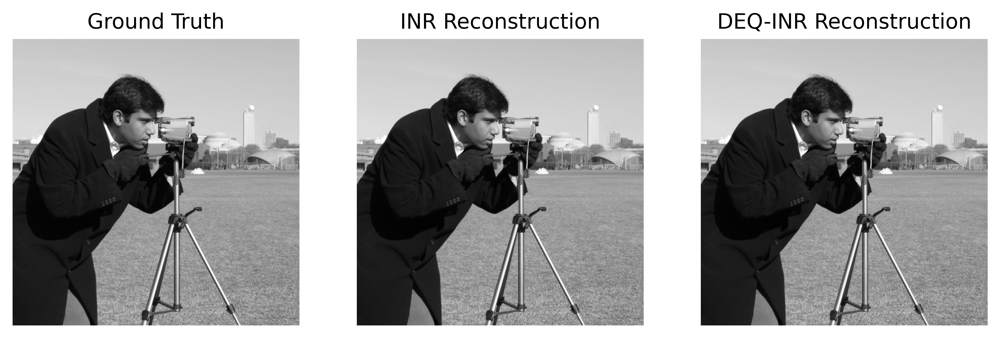

In [9]:
#PARENT PAPER METHODOLOGY, SWAPPED WITH CAMERAMAN

import numpy as np

import torch
import torch.nn as nn

from torchdeq import get_deq
from torchdeq.norm import apply_norm, reset_norm

######################################
#
# Linear Layers
#
######################################

class INRInjection(nn.Linear):
  def __init__(self, in_features, d_hidden, scale=256):
    super().__init__(in_features, d_hidden)
    self.weight.data *= scale
    self.bias.data.uniform_(-np.pi, np.pi)


class MFNLinear(nn.Linear):
  def __init__(self, d_hidden, scale=256):
    super().__init__(d_hidden, d_hidden)
    nn.init.uniform_(self.weight, -np.sqrt(1 / d_hidden), np.sqrt(1 / d_hidden))

######################################
#
# DEQ-INR Base class
#
######################################

class DEQINRBase(nn.Module):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__()

    self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
    self.mfn = nn.ModuleList([
        MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
    self.out = nn.Linear(d_hidden, d_out)

    self.d_hidden = d_hidden
    self.n_layer  = n_layer

    self.register_buffer('z_aux', self._init_z())
    self.deq_mode = deq_mode
    self.deq = get_deq(**kwargs)

    # This function automatically decorates weights in your DEQ layer
    # to have weight/spectral normalization. (for better stability)
    # Using norm_type='none' in `kwargs` can also skip it.
    apply_norm(self.mfn, **kwargs)

  def _init_z(self):
    raise NotImplemented

  def injection(self, x):
    raise NotImplemented

  def filter(self, z, u):
    raise NotImplemented

  def mfn_forward(self, z, u):
    # Fixed point reuse
    z = z + self.filter(self.z_aux, u[0])

    for i, layer in enumerate(self.mfn):
      z = self.filter(layer(z), u[i+1])

    return z

  def forward(self, x, z=None):
    reuse = True
    if z is None:
      z = torch.zeros(x.shape[0], self.d_hidden).to(x)
      reuse = False

    u = self.injection(x)

    reset_norm(self.mfn)
    f = lambda z: self.mfn_forward(z, u)
    if self.deq_mode:
      solver_kwargs = {'f_max_iter':0} if reuse else {}
      z_pred, info = self.deq(f, z, solver_kwargs=solver_kwargs)
    else:
      z_pred = [f(z)]

    outputs = [self.out(z) for z in z_pred]

    return outputs, z_pred[-1]

######################################
#
# DEQ-INR Instantiations by different filters
#
######################################

class DEQSirenINR(DEQINRBase):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

  def _init_z(self):
    return torch.zeros(1, self.d_hidden)

  def injection(self, x):
    u = self.inj(x)
    u = u.chunk(self.n_layer+1, dim=1)

    return u

  def filter(self, z, u):
    return torch.sin(z + u)


class DEQFourierINR(DEQINRBase):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

  def _init_z(self):
    return torch.ones(1, self.d_hidden)

  def injection(self, x):
    u = torch.sin(self.inj(x))
    u = u.chunk(self.n_layer+1, dim=1)

    return u

  def filter(self, z, u):
    return z * u


_model_class = {
  'Fourier': DEQFourierINR,
  'Siren': DEQSirenINR
}


def get_model(filter):
  assert filter in _model_class
  return _model_class[filter]

import skimage
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
from torchdeq.loss import fp_correction

# Normalize input np.array
# Convert np.array to tensor
def preprocess(x, normalize=False, device=None, dtype=None):
  if normalize:
      x = 2 * x - 1
  B, H, W, C = x.shape

  x = torch.tensor(x, device=device).float()
  return x.reshape(B*H*W, C)


# Convert tensor to np.array
# Clip min/max values
def postprocess(x):
  return torch.clip((x.detach() + 1)/2, 0, 1)


# Calculate PSNR
def PSNR(y_orig, y_pred):
  mse = torch.mean((y_orig - y_pred) ** 2)
  max_pixel = 1.0
  psnr = 20 * torch.log10(max_pixel / torch.sqrt(mse))
  return psnr.item()

def load_data(img, grid_size, device=None, show_img=True):
  # Load image
  if img == 'astronaut':
    image = skimage.data.astronaut()
    dataset = image.reshape(1, 512, 512, 3).astype(np.float32) / 255
  else:
    image = skimage.data.camera()
    dataset = image.reshape(1, 512, 512, 1).astype(np.float32) / 255

  data_channels = dataset.shape[-1]
  RES = image.shape[1]

  full_x = np.linspace(0, 1, RES) * 2 - 1
  full_x_grid = np.stack(np.meshgrid(full_x,full_x), axis=-1)[None, :, :]

  # Downsampling
  x_train_data = x_test_data = full_x_grid[:, ::RES // grid_size, ::RES // grid_size]
  y_train_data = y_test_data = dataset[:, ::RES // grid_size, ::RES // grid_size]
  print("Shape of x_train", x_train_data.shape)
  print("Shape of y_train", y_train_data.shape)

  # Visualize the image if requested
  if show_img:
    fig, ax = plt.subplots(1, 3, figsize=(10, 3))
    if img == 'astronaut':
      ax[0].imshow(y_train_data[0, :, :, :])
    else:
      ax[0].imshow(y_train_data[0, :, :, 0], cmap='gray')
    ax[0].set_title("image")
    ax[0].axis('off')
    ax[1].imshow(x_train_data[0, :, :, 0])
    ax[1].set_title("horizontal mesh_grid")
    ax[1].axis('off')
    ax[2].imshow(x_train_data[0, :, :, 1])
    ax[2].set_title("vertical mesh_grid")
    ax[2].axis('off')

  # Transform to tensors
  x_train = preprocess(x_train_data, device=device)
  y_train = preprocess(y_train_data, normalize=True, device=device)

  return x_train, y_train

def train(model, x_train, y_train, lr=1e-3, log_freq=100):
  # Compute compression rate
  n_params = sum(p.numel() for p in model.parameters())
  img_size = y_train.numel()
  print(f'Model Parameters: {n_params:,}')
  print(f'Img Size: {img_size:,}')
  print(f'Compression ratio: {n_params/img_size:.3f}')

  # Training loop
  optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0.0)
  scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)

  loss_log, psnr_log = [], []

  z_star = None
  for i in tqdm(range(epochs)):
    y_pred, z_pred = model(x_train, z_star)
    if deq_mode and reuse:
      z_star = z_pred.detach()

    # If you use trajectory sampling, fp_correction automatically
    # aligns the tensors and applies your loss function.
    loss_fn = lambda y_gt, y: ((y_gt - y) ** 2).mean()
    train_loss = fp_correction(loss_fn, (y_train, y_pred))

    train_loss.backward()
    optimizer.step()
    scheduler.step()

    loss_log.append(train_loss.item())

    train_psnr = PSNR(postprocess(y_train), postprocess(y_pred[-1]))
    psnr_log.append(train_psnr)
    if (i+1) % log_freq == 0:
      with torch.inference_mode():
        y_pred, _ = model(x_train)
      psnr = PSNR(postprocess(y_train), postprocess(y_pred[-1]))
      print(f"[Train] Loss: {train_loss.item():.5f}, || PSNR: {psnr:.2f} || Lr: {scheduler.get_last_lr()}")

    optimizer.zero_grad()
  return y_pred[-1], loss_log, psnr_log

def plot_training_stats(loss_log, psnr_log):
  fig, ax1 = plt.subplots()
  ax1.plot(loss_log, color='orange', label='Train Loss')
  ax1.set_xlabel("epoch")
  ax1.semilogy()

  ax2 = ax1.twinx()
  ax2.plot(psnr_log, color='b', label='PSNR')
  plt.title("training curve")

  ax1.legend(loc='best')
  ax2.legend(loc='best')

def visualize_results(y_orig, y_pred, grid_size=128):
  y_orig = postprocess(y_orig).detach().cpu().numpy()
  y_pred = postprocess(y_pred).detach().cpu().numpy()
  data_channels = y_orig.shape[-1]

  fig, ax = plt.subplots(1, 2, figsize=(10, 24))
  if data_channels == 1:
    ax[0].imshow(y_orig.reshape(grid_size, grid_size), cmap='gray')
    ax[1].imshow(y_pred.reshape(grid_size, grid_size), cmap='gray')
  else:
    ax[0].imshow(y_orig.reshape((grid_size, grid_size, data_channels)))
    ax[1].imshow(y_pred.reshape((grid_size, grid_size, data_channels)))

  ax[0].set_title("GT")
  ax[0].axis('off')
  ax[1].set_title("Reconstruction")
  ax[1].axis('off')

def visualize_triple_results(y_orig, exp_y_pred, imp_y_pred, grid_size=512, file_name=None):
    y_orig = postprocess(y_orig).detach().cpu().numpy()
    exp_y_pred = postprocess(exp_y_pred).detach().cpu().numpy()
    imp_y_pred = postprocess(imp_y_pred).detach().cpu().numpy()
    data_channels = y_orig.shape[-1]

    fig, ax = plt.subplots(1, 3, figsize=(10, 40), dpi=500)
    if data_channels == 1:
        ax[0].imshow(y_orig.reshape(grid_size, grid_size), cmap='gray')
        ax[1].imshow(exp_y_pred.reshape(grid_size, grid_size), cmap='gray')
        ax[2].imshow(imp_y_pred.reshape(grid_size, grid_size), cmap='gray')
    else:
        ax[0].imshow(y_orig.reshape((grid_size, grid_size, data_channels)))
        ax[1].imshow(exp_y_pred.reshape((grid_size, grid_size, data_channels)))
        ax[2].imshow(imp_y_pred.reshape((grid_size, grid_size, data_channels)))

    ax[0].set_title("Ground Truth")
    ax[0].axis('off')
    ax[1].set_title("INR Reconstruction")
    ax[1].axis('off')
    ax[2].set_title("DEQ-INR Reconstruction")
    ax[2].axis('off')

    # If a filename is provided, save the figure to a file.
    if file_name:
        plt.savefig(file_name, bbox_inches='tight', pad_inches=0.1)
    else:
        plt.show()

class DEQSirenINR(DEQINRBase):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

  def _init_z(self):
    return torch.zeros(1, self.d_hidden)

  def injection(self, x):
    u = self.inj(x)
    u = u.chunk(self.n_layer+1, dim=1)

    return u

  def filter(self, z, u):
    return torch.sin(z + u)


class DEQFourierINR(DEQINRBase):
  def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
          deq_mode=True, **kwargs):
    super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

  def _init_z(self):
    return torch.ones(1, self.d_hidden)

  def injection(self, x):
    u = torch.sin(self.inj(x))
    u = u.chunk(self.n_layer+1, dim=1)

    return u

  def filter(self, z, u):
    return z * u


_model_class = {
  'Fourier': DEQFourierINR,
  'Siren': DEQSirenINR
}


def get_model(filter):
  assert filter in _model_class
  return _model_class[filter]
# Configs for INR
grid_size = 512
img = 'camera' # Changed from skimage.data.camera() to a string identifier

lr = 1e-2
epochs = 500

filter = 'Fourier'
d_hidden = 256
n_layer = 3
scale = 256.

deq_mode = False
reuse = False
ift = False
grad = 1
norm_type = 'none'

device = torch.device('cuda:0')
log_freq = 100

# Training a mini INR for image reconstruction!
Model = get_model(filter)

x_train, y_train = load_data(img, grid_size, device=device, show_img=False)
model = Model(d_in=2, d_out=y_train.shape[-1], d_hidden=d_hidden, n_layer=n_layer, scale=scale,
        deq_mode=deq_mode, ift=ift, grad=grad, norm_type=norm_type).to(device)

exp_y_pred, loss_log, psnr_log = train(model, x_train, y_train, lr=lr, log_freq=log_freq)


# Configs for DEQ-INR
grid_size = 512
img = 'camera' # Changed from skimage.data.camera() to a string identifier

lr = 1e-2
epochs = 500

filter = 'Fourier'
d_hidden = 256
n_layer = 3
scale = 128.

deq_mode = True
reuse = True
ift = False
grad = 5
norm_type = 'spectral_norm'


device = torch.device('cuda:0')
log_freq = 100

# Training a mini INR for image reconstruction!
Model = get_model(filter)

x_train, y_train = load_data(img, grid_size, device=device, show_img=False)
model = Model(d_in=2, d_out=y_train.shape[-1], d_hidden=d_hidden, n_layer=n_layer, scale=scale,
        deq_mode=deq_mode, ift=ift, grad=grad, norm_type=norm_type).to(device)

y_pred, loss_log, psnr_log = train(model, x_train, y_train, lr=lr, log_freq=log_freq)


# Visualize the reconstruction results
visualize_triple_results(y_train, exp_y_pred, y_pred, grid_size=grid_size, file_name='camera.png')

Loading data...

STAGE 1: Training DEQ Base Model
DEQ Model Parameters: 201,219


 20%|██        | 100/500 [01:09<04:35,  1.45it/s]

[Stage 1 DEQ] Epoch 100 | Loss: 0.00324 | PSNR: 31.03


 40%|████      | 200/500 [02:19<03:34,  1.40it/s]

[Stage 1 DEQ] Epoch 200 | Loss: 0.00191 | PSNR: 33.33


 60%|██████    | 300/500 [03:30<02:22,  1.41it/s]

[Stage 1 DEQ] Epoch 300 | Loss: 0.00152 | PSNR: 34.33


 80%|████████  | 400/500 [04:41<01:11,  1.40it/s]

[Stage 1 DEQ] Epoch 400 | Loss: 0.00133 | PSNR: 34.90


100%|██████████| 500/500 [05:52<00:00,  1.42it/s]

[Stage 1 DEQ] Epoch 500 | Loss: 0.00129 | PSNR: 35.06

Stage 1 Complete! Final DEQ PSNR: 35.06 dB

STAGE 2: Training Conservative Refiner (frozen mode)
Refiner Parameters: 134,659
Total Parameters: 335,878


DEQ Baseline PSNR: 35.06 dB


 34%|███▎      | 101/300 [00:13<00:27,  7.30it/s]

[Stage 2 Frozen] Epoch 100 | Loss: 0.00125 | PSNR: 35.19 | Res Mag: 0.00345 | Best: 35.19


 67%|██████▋   | 201/300 [00:26<00:12,  7.67it/s]

[Stage 2 Frozen] Epoch 200 | Loss: 0.00124 | PSNR: 35.22 | Res Mag: 0.00419 | Best: 35.22


100%|██████████| 300/300 [00:39<00:00,  7.58it/s]


[Stage 2 Frozen] Epoch 300 | Loss: 0.00124 | PSNR: 35.22 | Res Mag: 0.00425 | Best: 35.22

FINAL RESULTS
Final DEQ PSNR (Stage 1):     35.06 dB
Final Refined PSNR (Stage 2): 35.22 dB
Improvement:                  +0.16 dB


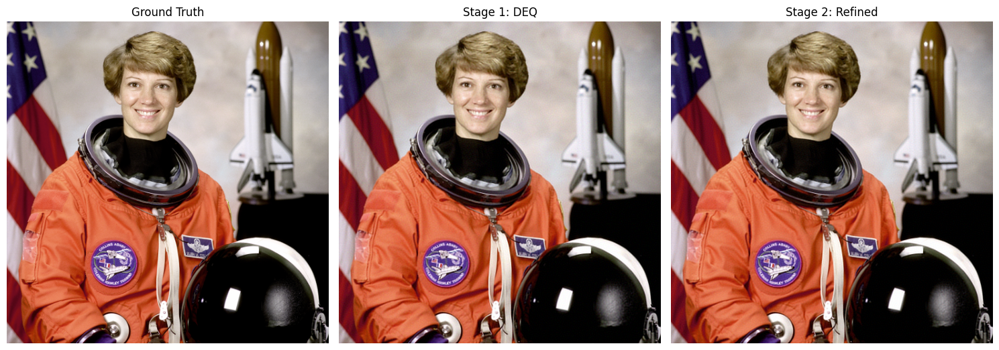

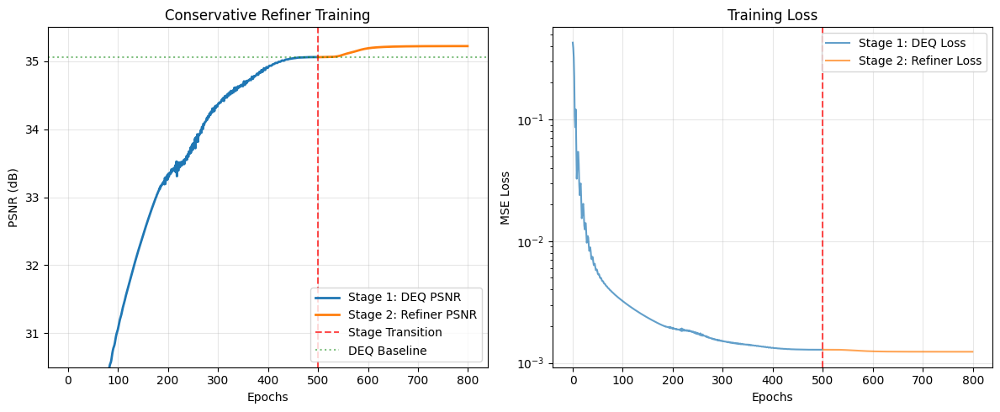


Training complete!


In [3]:
#FROZEN + REFINER ASTRONAUT

import numpy as np
import skimage
import skimage.data
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
from torch.nn.utils import spectral_norm
from torchdeq import get_deq
from torchdeq.norm import apply_norm, reset_norm
from torchdeq.loss import fp_correction

######################################
#
# Linear Layers
#
######################################

class INRInjection(nn.Linear):
    def __init__(self, in_features, d_hidden, scale=256):
        super().__init__(in_features, d_hidden)
        self.weight.data *= scale
        self.bias.data.uniform_(-np.pi, np.pi)

class MFNLinear(nn.Linear):
    def __init__(self, d_hidden, scale=256):
        super().__init__(d_hidden, d_hidden)
        nn.init.uniform_(self.weight, -np.sqrt(1 / d_hidden), np.sqrt(1 / d_hidden))

######################################
#
# DEQ-INR Base class
#
######################################

class DEQINRBase(nn.Module):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
                 deq_mode=True, **kwargs):
        super().__init__()
        self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
        self.mfn = nn.ModuleList([
            MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
        self.out = nn.Linear(d_hidden, d_out)
        self.d_hidden = d_hidden
        self.n_layer  = n_layer
        self.register_buffer('z_aux', self._init_z())
        self.deq_mode = deq_mode

        self.deq = get_deq(**kwargs)
        apply_norm(self.mfn, **kwargs)

    def _init_z(self):
        raise NotImplemented

    def injection(self, x):
        raise NotImplemented

    def filter(self, z, u):
        raise NotImplemented

    def mfn_forward(self, z, u):
        z = z + self.filter(self.z_aux, u[0])
        for i, layer in enumerate(self.mfn):
            z = self.filter(layer(z), u[i+1])
        return z

    def forward(self, x, z=None):
        reuse = True
        if z is None:
            z = torch.zeros(x.shape[0], self.d_hidden).to(x)
            reuse = False

        u = self.injection(x)
        reset_norm(self.mfn)
        f = lambda z: self.mfn_forward(z, u)

        if self.deq_mode:
            solver_kwargs = {'f_max_iter':0} if reuse else {}
            z_pred, info = self.deq(f, z, solver_kwargs=solver_kwargs)
        else:
            z_pred = [f(z)]

        if not isinstance(z_pred, list):
            z_pred = [z_pred]

        outputs = [self.out(z_step) for z_step in z_pred]
        return outputs, z_pred[-1]

######################################
#
# Models
#
######################################

class DEQFourierINR(DEQINRBase):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
                 deq_mode=True, **kwargs):
        super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

    def _init_z(self):
        return torch.ones(1, self.d_hidden)

    def injection(self, x):
        u = torch.sin(self.inj(x))
        u = u.chunk(self.n_layer+1, dim=1)
        return u

    def filter(self, z, u):
        return z * u

# Conservative refiner - matches DEQ scale and architecture
class ConservativeRefiner(nn.Module):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=2, scale=128.):
        super().__init__()
        # Use SAME scale as DEQ to avoid instability
        # Input is just coordinates - we'll add DEQ prediction as a skip connection
        self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
        self.mfn = nn.ModuleList([
            MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
        # Small initialization for output layer - start with near-zero residuals
        self.out = nn.Linear(d_hidden, d_out)
        nn.init.normal_(self.out.weight, std=0.001)
        nn.init.zeros_(self.out.bias)

        self.n_layer = n_layer
        self.d_hidden = d_hidden
        self.register_buffer('z_aux', torch.ones(1, d_hidden))  # Match DEQ

    def filter(self, z, u):
        # Use Fourier filter like DEQ for consistency
        return z * u

    def forward(self, x):
        # Only use coordinates, not DEQ prediction
        u = torch.sin(self.inj(x))
        u = u.chunk(self.n_layer+1, dim=1)

        z = self.filter(self.z_aux, u[0])
        for i, layer in enumerate(self.mfn):
            z = self.filter(layer(z), u[i+1])

        residual = self.out(z)
        return residual

######################################
#
# Helpers
#
######################################

def preprocess(x, normalize=False, device=None):
    if normalize:
        x = 2 * x - 1
    B, H, W, C = x.shape
    x = torch.tensor(x, device=device).float()
    return x.reshape(B*H*W, C)

def postprocess(x):
    return torch.clip((x.detach() + 1)/2, 0, 1)

def PSNR(y_orig, y_pred):
    mse = torch.mean((y_orig - y_pred) ** 2) + 1e-9
    max_pixel = 1.0
    psnr = 20 * torch.log10(max_pixel / torch.sqrt(mse))
    return psnr.item()

def load_data(img, grid_size, device=None, show_img=True):
    if img == 'astronaut':
        image = skimage.data.astronaut()
        dataset = image.reshape(1, 512, 512, 3).astype(np.float32) / 255
    else:
        image = skimage.data.camera()
        dataset = image.reshape(1, 512, 512, 1).astype(np.float32) / 255

    data_channels = dataset.shape[-1]
    RES = image.shape[1]
    full_x = np.linspace(0, 1, RES) * 2 - 1
    full_x_grid = np.stack(np.meshgrid(full_x,full_x), axis=-1)[None, :, :]

    x_train_data = full_x_grid[:, ::RES // grid_size, ::RES // grid_size]
    y_train_data = dataset[:, ::RES // grid_size, ::RES // grid_size]

    x_train = preprocess(x_train_data, device=device)
    y_train = preprocess(y_train_data, normalize=True, device=device)
    return x_train, y_train

def visualize_results(y_gt, y_deq, y_refined, grid_size=512, file_name=None):
    y_gt = postprocess(y_gt).detach().cpu().numpy()
    y_deq = postprocess(y_deq).detach().cpu().numpy()
    y_refined = postprocess(y_refined).detach().cpu().numpy()

    data_channels = y_gt.shape[-1]
    fig, ax = plt.subplots(1, 3, figsize=(15, 6))

    imgs = [y_gt, y_deq, y_refined]
    titles = ["Ground Truth", "Stage 1: DEQ", "Stage 2: Refined"]

    for i, img in enumerate(imgs):
        if data_channels == 1:
            ax[i].imshow(img.reshape(grid_size, grid_size), cmap='gray')
        else:
            ax[i].imshow(img.reshape((grid_size, grid_size, data_channels)))
        ax[i].set_title(titles[i])
        ax[i].axis('off')

    plt.tight_layout()
    if file_name:
        plt.savefig(file_name)
    plt.show()

######################################
#
# Training Loops
#
######################################

# Stage 1: Train DEQ with fp_correction (matching original approach)
def train_stage1_deq(model, x_train, y_train, epochs, lr, log_freq):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0.0)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)
    loss_log, psnr_log = [], []
    z_star = None

    model.train()
    for i in tqdm(range(epochs)):
        y_pred_list, z_pred = model(x_train, z_star)

        if model.deq_mode:
            z_star = z_pred.detach()

        # Use fp_correction like the original approach
        loss_fn = lambda y_gt, y: ((y_gt - y) ** 2).mean()
        loss = fp_correction(loss_fn, (y_train, y_pred_list))

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_pred_list[-1]))
        psnr_log.append(current_psnr)

        if (i+1) % log_freq == 0:
            print(f"[Stage 1 DEQ] Epoch {i+1} | Loss: {loss.item():.5f} | PSNR: {current_psnr:.2f}")

    return y_pred_list[-1], z_star, loss_log, psnr_log

# Stage 2: FREEZE DEQ, train only refiner
def train_stage2_frozen_deq(refiner, deq_model, x_train, y_train, epochs, lr, log_freq, warmup_epochs=50):
    """
    Keep DEQ completely frozen. Only train refiner.
    Use warmup to start with very small residuals.
    """
    optimizer = torch.optim.Adam(refiner.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)

    loss_log, psnr_log = [], []
    deq_model.eval()  # FROZEN
    refiner.train()

    # Pre-compute DEQ output once (it's frozen)
    with torch.no_grad():
        y_deq_pred, _ = deq_model(x_train)
        y_deq_pred = y_deq_pred[-1].detach()
        baseline_psnr = PSNR(postprocess(y_train), postprocess(y_deq_pred))
        print(f"DEQ Baseline PSNR: {baseline_psnr:.2f} dB")

    best_psnr = baseline_psnr
    best_state = None
    patience_counter = 0

    for i in tqdm(range(epochs)):
        # Refiner predicts residual from coordinates only
        residual = refiner(x_train)

        # Warmup: gradually increase residual magnitude
        if i < warmup_epochs:
            alpha = i / warmup_epochs
            residual = residual * alpha

        y_final = y_deq_pred + residual

        # Loss with L2 regularization on residuals
        recon_loss = ((y_train - y_final) ** 2).mean()
        reg_loss = 0.001 * (residual ** 2).mean()
        loss = recon_loss + reg_loss

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(refiner.parameters(), 0.5)  # Gentle clipping
        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_final))
        psnr_log.append(current_psnr)

        # Early stopping if PSNR degrades
        if current_psnr > best_psnr:
            best_psnr = current_psnr
            best_state = {k: v.cpu().clone() for k, v in refiner.state_dict().items()}
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter > 100:  # Stop if no improvement for 100 epochs
            print(f"\nEarly stopping at epoch {i+1}. Best PSNR: {best_psnr:.2f}")
            break

        if (i+1) % log_freq == 0:
            res_mag = residual.abs().mean().item()
            print(f"[Stage 2 Frozen] Epoch {i+1} | Loss: {loss.item():.5f} | "
                  f"PSNR: {current_psnr:.2f} | Res Mag: {res_mag:.5f} | Best: {best_psnr:.2f}")

    # Restore best model
    if best_state is not None:
        refiner.load_state_dict({k: v.to(x_train.device) for k, v in best_state.items()})
        with torch.no_grad():
            residual = refiner(x_train)
            y_final = y_deq_pred + residual

    return y_final, loss_log, psnr_log

# Stage 2 Alternative: Very conservative joint training
def train_stage2_conservative_joint(refiner, deq_model, x_train, y_train, epochs, lr_ref, lr_deq, log_freq):
    """
    Extremely conservative joint training.
    DEQ gets 100x smaller learning rate and only updates every 10 steps.
    """
    optimizer = torch.optim.Adam([
        {'params': refiner.parameters(), 'lr': lr_ref, 'weight_decay': 1e-5},
        {'params': deq_model.parameters(), 'lr': lr_deq, 'weight_decay': 0}
    ])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-7)

    loss_log, psnr_log = [], []
    deq_model.train()
    refiner.train()

    z_star = None

    with torch.no_grad():
        y_deq_init, _ = deq_model(x_train)
        baseline_psnr = PSNR(postprocess(y_train), postprocess(y_deq_init[-1]))
        print(f"Initial DEQ PSNR: {baseline_psnr:.2f} dB")

    best_psnr = baseline_psnr

    for i in tqdm(range(epochs)):
        # DEQ forward
        y_deq_pred_list, z_pred = deq_model(x_train, z_star)
        y_deq_pred = y_deq_pred_list[-1]

        if deq_model.deq_mode:
            z_star = z_pred.detach()

        # Refiner forward
        residual = refiner(x_train)
        y_final = y_deq_pred + residual

        # Loss
        recon_loss = ((y_train - y_final) ** 2).mean()
        reg_loss = 0.01 * (residual ** 2).mean()

        # DEQ should maintain its quality
        deq_loss = fp_correction(lambda y_gt, y: ((y_gt - y) ** 2).mean(), (y_train, y_deq_pred_list))

        # Combined: 90% on final output, 10% on maintaining DEQ
        loss = 0.9 * (recon_loss + reg_loss) + 0.1 * deq_loss

        optimizer.zero_grad()
        loss.backward()

        # Very gentle clipping
        torch.nn.utils.clip_grad_norm_(refiner.parameters(), 0.5)
        torch.nn.utils.clip_grad_norm_(deq_model.parameters(), 0.1)

        # Only update DEQ every 10 steps
        if i % 10 != 0:
            for param in deq_model.parameters():
                param.grad = None

        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_final))
        psnr_log.append(current_psnr)
        best_psnr = max(best_psnr, current_psnr)

        if (i+1) % log_freq == 0:
            print(f"[Stage 2 Conservative] Epoch {i+1} | Loss: {loss.item():.5f} | "
                  f"PSNR: {current_psnr:.2f} | Best: {best_psnr:.2f}")

    return y_final, loss_log, psnr_log

######################################
#
# Main Execution
#
######################################

# Configs
grid_size = 512
img = 'astronaut'
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

d_hidden = 256
n_layer = 3
scale = 128.
log_freq = 100

# STAGE 1 Configs
lr_deq = 1e-2
epochs_deq = 500
grad_deq = 5
norm_deq = 'spectral_norm'

# STAGE 2 Configs
lr_ref = 1e-3
epochs_ref = 300
refiner_n_layer = 2
refiner_scale = 128.  # SAME as DEQ

# Choose training mode
TRAINING_MODE = "frozen"  # Options: "frozen" or "conservative_joint"

# Load Data
print("Loading data...")
x_train, y_train = load_data(img, grid_size, device=device, show_img=False)
d_out = y_train.shape[-1]

# --- 1. Train DEQ Model ---
print("\n" + "="*60)
print("STAGE 1: Training DEQ Base Model")
print("="*60)
deq_model = DEQFourierINR(d_in=2, d_out=d_out, d_hidden=d_hidden, n_layer=n_layer, scale=scale,
                          deq_mode=True, grad=grad_deq, norm_type=norm_deq).to(device)

n_params_deq = sum(p.numel() for p in deq_model.parameters())
print(f'DEQ Model Parameters: {n_params_deq:,}')

y_deq, z_star, loss1, psnr1 = train_stage1_deq(deq_model, x_train, y_train, epochs_deq, lr_deq, log_freq)

print(f"\nStage 1 Complete! Final DEQ PSNR: {psnr1[-1]:.2f} dB")

# --- 2. Train Conservative Refiner ---
print("\n" + "="*60)
print(f"STAGE 2: Training Conservative Refiner ({TRAINING_MODE} mode)")
print("="*60)
refiner_model = ConservativeRefiner(d_in=2, d_out=d_out, d_hidden=d_hidden,
                                    n_layer=refiner_n_layer, scale=refiner_scale).to(device)

n_params_ref = sum(p.numel() for p in refiner_model.parameters())
print(f'Refiner Parameters: {n_params_ref:,}')
print(f'Total Parameters: {n_params_deq + n_params_ref:,}')

if TRAINING_MODE == "frozen":
    y_refined, loss2, psnr2 = train_stage2_frozen_deq(
        refiner_model, deq_model, x_train, y_train,
        epochs_ref, lr_ref, log_freq, warmup_epochs=50
    )
else:  # conservative_joint
    lr_deq_stage2 = lr_deq / 100  # 100x smaller
    y_refined, loss2, psnr2 = train_stage2_conservative_joint(
        refiner_model, deq_model, x_train, y_train,
        epochs_ref, lr_ref, lr_deq_stage2, log_freq
    )

# --- Results ---
print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"Final DEQ PSNR (Stage 1):     {psnr1[-1]:.2f} dB")
print(f"Final Refined PSNR (Stage 2): {psnr2[-1]:.2f} dB")
improvement = psnr2[-1] - psnr1[-1]
print(f"Improvement:                  {improvement:+.2f} dB")

if improvement < 0:
    print("\n⚠️  WARNING: Refiner decreased PSNR. This suggests:")
    print("   - The DEQ baseline is already very strong")
    print("   - The refiner may be overfitting")
    print("   - Try reducing refiner complexity or increasing regularization")

# --- Visualization ---
visualize_results(y_train, y_deq, y_refined, grid_size=grid_size, file_name='dsnr_conservative.png')

# Plot Training Curves
plt.figure(figsize=(12,5))

plt.subplot(1, 2, 1)
plt.plot(psnr1, label='Stage 1: DEQ PSNR', linewidth=2)
plt.plot(range(epochs_deq, epochs_deq+len(psnr2)), psnr2, label='Stage 2: Refiner PSNR', linewidth=2)
plt.axvline(x=epochs_deq, color='r', linestyle='--', alpha=0.7, label='Stage Transition')
plt.axhline(y=psnr1[-1], color='g', linestyle=':', alpha=0.5, label='DEQ Baseline')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.title('Conservative Refiner Training')
plt.legend()
plt.grid(alpha=0.3)
plt.ylim(30.5, 35.5)

plt.subplot(1, 2, 2)
plt.plot(loss1, label='Stage 1: DEQ Loss', alpha=0.7)
plt.plot(range(epochs_deq, epochs_deq+len(loss2)), loss2, label='Stage 2: Refiner Loss', alpha=0.7)
plt.axvline(x=epochs_deq, color='r', linestyle='--', alpha=0.7)
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Training Loss')
plt.legend()
plt.grid(alpha=0.3)
plt.yscale('log')

plt.tight_layout()
plt.savefig('dsnr_conservative_curves.png')
plt.show()

print("\nTraining complete!")

In [1]:
'''
#CONSERVATIVE JOINT + REFINER ASTRONAUT

import numpy as np
import skimage
import skimage.data
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
from torch.nn.utils import spectral_norm
from torchdeq import get_deq
from torchdeq.norm import apply_norm, reset_norm
from torchdeq.loss import fp_correction

######################################
#
# Linear Layers
#
######################################

class INRInjection(nn.Linear):
    def __init__(self, in_features, d_hidden, scale=256):
        super().__init__(in_features, d_hidden)
        self.weight.data *= scale
        self.bias.data.uniform_(-np.pi, np.pi)

class MFNLinear(nn.Linear):
    def __init__(self, d_hidden, scale=256):
        super().__init__(d_hidden, d_hidden)
        nn.init.uniform_(self.weight, -np.sqrt(1 / d_hidden), np.sqrt(1 / d_hidden))

######################################
#
# DEQ-INR Base class
#
######################################

class DEQINRBase(nn.Module):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
                 deq_mode=True, **kwargs):
        super().__init__()
        self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
        self.mfn = nn.ModuleList([
            MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
        self.out = nn.Linear(d_hidden, d_out)
        self.d_hidden = d_hidden
        self.n_layer  = n_layer
        self.register_buffer('z_aux', self._init_z())
        self.deq_mode = deq_mode

        self.deq = get_deq(**kwargs)
        apply_norm(self.mfn, **kwargs)

    def _init_z(self):
        raise NotImplemented

    def injection(self, x):
        raise NotImplemented

    def filter(self, z, u):
        raise NotImplemented

    def mfn_forward(self, z, u):
        z = z + self.filter(self.z_aux, u[0])
        for i, layer in enumerate(self.mfn):
            z = self.filter(layer(z), u[i+1])
        return z

    def forward(self, x, z=None):
        reuse = True
        if z is None:
            z = torch.zeros(x.shape[0], self.d_hidden).to(x)
            reuse = False

        u = self.injection(x)
        reset_norm(self.mfn)
        f = lambda z: self.mfn_forward(z, u)

        if self.deq_mode:
            solver_kwargs = {'f_max_iter':0} if reuse else {}
            z_pred, info = self.deq(f, z, solver_kwargs=solver_kwargs)
        else:
            z_pred = [f(z)]

        if not isinstance(z_pred, list):
            z_pred = [z_pred]

        outputs = [self.out(z_step) for z_step in z_pred]
        return outputs, z_pred[-1]

######################################
#
# Models
#
######################################

class DEQFourierINR(DEQINRBase):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
                 deq_mode=True, **kwargs):
        super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

    def _init_z(self):
        return torch.ones(1, self.d_hidden)

    def injection(self, x):
        u = torch.sin(self.inj(x))
        u = u.chunk(self.n_layer+1, dim=1)
        return u

    def filter(self, z, u):
        return z * u

# Conservative refiner - matches DEQ scale and architecture
class ConservativeRefiner(nn.Module):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=2, scale=128.):
        super().__init__()
        # Use SAME scale as DEQ to avoid instability
        # Input is just coordinates - we'll add DEQ prediction as a skip connection
        self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
        self.mfn = nn.ModuleList([
            MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
        # Small initialization for output layer - start with near-zero residuals
        self.out = nn.Linear(d_hidden, d_out)
        nn.init.normal_(self.out.weight, std=0.001)
        nn.init.zeros_(self.out.bias)

        self.n_layer = n_layer
        self.d_hidden = d_hidden
        self.register_buffer('z_aux', torch.ones(1, d_hidden))  # Match DEQ

    def filter(self, z, u):
        # Use Fourier filter like DEQ for consistency
        return z * u

    def forward(self, x):
        # Only use coordinates, not DEQ prediction
        u = torch.sin(self.inj(x))
        u = u.chunk(self.n_layer+1, dim=1)

        z = self.filter(self.z_aux, u[0])
        for i, layer in enumerate(self.mfn):
            z = self.filter(layer(z), u[i+1])

        residual = self.out(z)
        return residual

######################################
#
# Helpers
#
######################################

def preprocess(x, normalize=False, device=None):
    if normalize:
        x = 2 * x - 1
    B, H, W, C = x.shape
    x = torch.tensor(x, device=device).float()
    return x.reshape(B*H*W, C)

def postprocess(x):
    return torch.clip((x.detach() + 1)/2, 0, 1)

def PSNR(y_orig, y_pred):
    mse = torch.mean((y_orig - y_pred) ** 2) + 1e-9
    max_pixel = 1.0
    psnr = 20 * torch.log10(max_pixel / torch.sqrt(mse))
    return psnr.item()

def load_data(img, grid_size, device=None, show_img=True):
    if img == 'astronaut':
        image = skimage.data.astronaut()
        dataset = image.reshape(1, 512, 512, 3).astype(np.float32) / 255
    else:
        image = skimage.data.camera()
        dataset = image.reshape(1, 512, 512, 1).astype(np.float32) / 255

    data_channels = dataset.shape[-1]
    RES = image.shape[1]
    full_x = np.linspace(0, 1, RES) * 2 - 1
    full_x_grid = np.stack(np.meshgrid(full_x,full_x), axis=-1)[None, :, :]

    x_train_data = full_x_grid[:, ::RES // grid_size, ::RES // grid_size]
    y_train_data = dataset[:, ::RES // grid_size, ::RES // grid_size]

    x_train = preprocess(x_train_data, device=device)
    y_train = preprocess(y_train_data, normalize=True, device=device)
    return x_train, y_train

def visualize_results(y_gt, y_deq, y_refined, grid_size=512, file_name=None):
    y_gt = postprocess(y_gt).detach().cpu().numpy()
    y_deq = postprocess(y_deq).detach().cpu().numpy()
    y_refined = postprocess(y_refined).detach().cpu().numpy()

    data_channels = y_gt.shape[-1]
    fig, ax = plt.subplots(1, 3, figsize=(15, 6))

    imgs = [y_gt, y_deq, y_refined]
    titles = ["Ground Truth", "Stage 1: DEQ", "Stage 2: Refined"]

    for i, img in enumerate(imgs):
        if data_channels == 1:
            ax[i].imshow(img.reshape(grid_size, grid_size), cmap='gray')
        else:
            ax[i].imshow(img.reshape((grid_size, grid_size, data_channels)))
        ax[i].set_title(titles[i])
        ax[i].axis('off')

    plt.tight_layout()
    if file_name:
        plt.savefig(file_name)
    plt.show()

######################################
#
# Training Loops
#
######################################

# Stage 1: Train DEQ with fp_correction (matching original approach)
def train_stage1_deq(model, x_train, y_train, epochs, lr, log_freq):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0.0)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)
    loss_log, psnr_log = [], []
    z_star = None

    model.train()
    for i in tqdm(range(epochs)):
        y_pred_list, z_pred = model(x_train, z_star)

        if model.deq_mode:
            z_star = z_pred.detach()

        # Use fp_correction like the original approach
        loss_fn = lambda y_gt, y: ((y_gt - y) ** 2).mean()
        loss = fp_correction(loss_fn, (y_train, y_pred_list))

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_pred_list[-1]))
        psnr_log.append(current_psnr)

        if (i+1) % log_freq == 0:
            print(f"[Stage 1 DEQ] Epoch {i+1} | Loss: {loss.item():.5f} | PSNR: {current_psnr:.2f}")

    return y_pred_list[-1], z_star, loss_log, psnr_log

# Stage 2: FREEZE DEQ, train only refiner
def train_stage2_frozen_deq(refiner, deq_model, x_train, y_train, epochs, lr, log_freq, warmup_epochs=50):
    """
    Keep DEQ completely frozen. Only train refiner.
    Use warmup to start with very small residuals.
    """
    optimizer = torch.optim.Adam(refiner.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)

    loss_log, psnr_log = [], []
    deq_model.eval()  # FROZEN
    refiner.train()

    # Pre-compute DEQ output once (it's frozen)
    with torch.no_grad():
        y_deq_pred, _ = deq_model(x_train)
        y_deq_pred = y_deq_pred[-1].detach()
        baseline_psnr = PSNR(postprocess(y_train), postprocess(y_deq_pred))
        print(f"DEQ Baseline PSNR: {baseline_psnr:.2f} dB")

    best_psnr = baseline_psnr
    best_state = None
    patience_counter = 0

    for i in tqdm(range(epochs)):
        # Refiner predicts residual from coordinates only
        residual = refiner(x_train)

        # Warmup: gradually increase residual magnitude
        if i < warmup_epochs:
            alpha = i / warmup_epochs
            residual = residual * alpha

        y_final = y_deq_pred + residual

        # Loss with L2 regularization on residuals
        recon_loss = ((y_train - y_final) ** 2).mean()
        reg_loss = 0.001 * (residual ** 2).mean()
        loss = recon_loss + reg_loss

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(refiner.parameters(), 0.5)  # Gentle clipping
        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_final))
        psnr_log.append(current_psnr)

        # Early stopping if PSNR degrades
        if current_psnr > best_psnr:
            best_psnr = current_psnr
            best_state = {k: v.cpu().clone() for k, v in refiner.state_dict().items()}
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter > 100:  # Stop if no improvement for 100 epochs
            print(f"\nEarly stopping at epoch {i+1}. Best PSNR: {best_psnr:.2f}")
            break

        if (i+1) % log_freq == 0:
            res_mag = residual.abs().mean().item()
            print(f"[Stage 2 Frozen] Epoch {i+1} | Loss: {loss.item():.5f} | "
                  f"PSNR: {current_psnr:.2f} | Res Mag: {res_mag:.5f} | Best: {best_psnr:.2f}")

    # Restore best model
    if best_state is not None:
        refiner.load_state_dict({k: v.to(x_train.device) for k, v in best_state.items()})
        with torch.no_grad():
            residual = refiner(x_train)
            y_final = y_deq_pred + residual

    return y_final, loss_log, psnr_log

# Stage 2 Alternative: Very conservative joint training
def train_stage2_conservative_joint(refiner, deq_model, x_train, y_train, epochs, lr_ref, lr_deq, log_freq):
    """
    Extremely conservative joint training.
    DEQ gets 100x smaller learning rate and only updates every 10 steps.
    """
    optimizer = torch.optim.Adam([
        {'params': refiner.parameters(), 'lr': lr_ref, 'weight_decay': 1e-5},
        {'params': deq_model.parameters(), 'lr': lr_deq, 'weight_decay': 0}
    ])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-7)

    loss_log, psnr_log = [], []
    deq_model.train()
    refiner.train()

    z_star = None

    with torch.no_grad():
        y_deq_init, _ = deq_model(x_train)
        baseline_psnr = PSNR(postprocess(y_train), postprocess(y_deq_init[-1]))
        print(f"Initial DEQ PSNR: {baseline_psnr:.2f} dB")

    best_psnr = baseline_psnr

    for i in tqdm(range(epochs)):
        # DEQ forward
        y_deq_pred_list, z_pred = deq_model(x_train, z_star)
        y_deq_pred = y_deq_pred_list[-1]

        if deq_model.deq_mode:
            z_star = z_pred.detach()

        # Refiner forward
        residual = refiner(x_train)
        y_final = y_deq_pred + residual

        # Loss
        recon_loss = ((y_train - y_final) ** 2).mean()
        reg_loss = 0.01 * (residual ** 2).mean()

        # DEQ should maintain its quality
        deq_loss = fp_correction(lambda y_gt, y: ((y_gt - y) ** 2).mean(), (y_train, y_deq_pred_list))

        # Combined: 90% on final output, 10% on maintaining DEQ
        loss = 0.9 * (recon_loss + reg_loss) + 0.1 * deq_loss

        optimizer.zero_grad()
        loss.backward()

        # Very gentle clipping
        torch.nn.utils.clip_grad_norm_(refiner.parameters(), 0.5)
        torch.nn.utils.clip_grad_norm_(deq_model.parameters(), 0.1)

        # Only update DEQ every 10 steps
        if i % 10 != 0:
            for param in deq_model.parameters():
                param.grad = None

        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_final))
        psnr_log.append(current_psnr)
        best_psnr = max(best_psnr, current_psnr)

        if (i+1) % log_freq == 0:
            print(f"[Stage 2 Conservative] Epoch {i+1} | Loss: {loss.item():.5f} | "
                  f"PSNR: {current_psnr:.2f} | Best: {best_psnr:.2f}")

    return y_final, loss_log, psnr_log

######################################
#
# Main Execution
#
######################################

# Configs
grid_size = 512
img = 'astronaut'
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

d_hidden = 256
n_layer = 3
scale = 128.
log_freq = 100

# STAGE 1 Configs
lr_deq = 1e-2
epochs_deq = 500
grad_deq = 5
norm_deq = 'spectral_norm'

# STAGE 2 Configs
lr_ref = 1e-3
epochs_ref = 300
refiner_n_layer = 2
refiner_scale = 128.  # SAME as DEQ

# Choose training mode
TRAINING_MODE = "conservative_joint"  # Options: "frozen" or "conservative_joint"

# Load Data
print("Loading data...")
x_train, y_train = load_data(img, grid_size, device=device, show_img=False)
d_out = y_train.shape[-1]

# --- 1. Train DEQ Model ---
print("\n" + "="*60)
print("STAGE 1: Training DEQ Base Model")
print("="*60)
deq_model = DEQFourierINR(d_in=2, d_out=d_out, d_hidden=d_hidden, n_layer=n_layer, scale=scale,
                          deq_mode=True, grad=grad_deq, norm_type=norm_deq).to(device)

n_params_deq = sum(p.numel() for p in deq_model.parameters())
print(f'DEQ Model Parameters: {n_params_deq:,}')

y_deq, z_star, loss1, psnr1 = train_stage1_deq(deq_model, x_train, y_train, epochs_deq, lr_deq, log_freq)

print(f"\nStage 1 Complete! Final DEQ PSNR: {psnr1[-1]:.2f} dB")

# --- 2. Train Conservative Refiner ---
print("\n" + "="*60)
print(f"STAGE 2: Training Conservative Refiner ({TRAINING_MODE} mode)")
print("="*60)
refiner_model = ConservativeRefiner(d_in=2, d_out=d_out, d_hidden=d_hidden,
                                    n_layer=refiner_n_layer, scale=refiner_scale).to(device)

n_params_ref = sum(p.numel() for p in refiner_model.parameters())
print(f'Refiner Parameters: {n_params_ref:,}')
print(f'Total Parameters: {n_params_deq + n_params_ref:,}')

if TRAINING_MODE == "frozen":
    y_refined, loss2, psnr2 = train_stage2_frozen_deq(
        refiner_model, deq_model, x_train, y_train,
        epochs_ref, lr_ref, log_freq, warmup_epochs=50
    )
else:  # conservative_joint
    lr_deq_stage2 = lr_deq / 100  # 100x smaller
    y_refined, loss2, psnr2 = train_stage2_conservative_joint(
        refiner_model, deq_model, x_train, y_train,
        epochs_ref, lr_ref, lr_deq_stage2, log_freq
    )

# --- Results ---
print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"Final DEQ PSNR (Stage 1):     {psnr1[-1]:.2f} dB")
print(f"Final Refined PSNR (Stage 2): {psnr2[-1]:.2f} dB")
improvement = psnr2[-1] - psnr1[-1]
print(f"Improvement:                  {improvement:+.2f} dB")

if improvement < 0:
    print("\n⚠️  WARNING: Refiner decreased PSNR. This suggests:")
    print("   - The DEQ baseline is already very strong")
    print("   - The refiner may be overfitting")
    print("   - Try reducing refiner complexity or increasing regularization")

# --- Visualization ---
visualize_results(y_train, y_deq, y_refined, grid_size=grid_size, file_name='dsnr_conservative.png')

# Plot Training Curves
plt.figure(figsize=(12,5))

plt.subplot(1, 2, 1)
plt.plot(psnr1, label='Stage 1: DEQ PSNR', linewidth=2)
plt.plot(range(epochs_deq, epochs_deq+len(psnr2)), psnr2, label='Stage 2: Refiner PSNR', linewidth=2)
plt.axvline(x=epochs_deq, color='r', linestyle='--', alpha=0.7, label='Stage Transition')
plt.axhline(y=psnr1[-1], color='g', linestyle=':', alpha=0.5, label='DEQ Baseline')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.title('Conservative Refiner Training')
plt.legend()
plt.grid(alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(loss1, label='Stage 1: DEQ Loss', alpha=0.7)
plt.plot(range(epochs_deq, epochs_deq+len(loss2)), loss2, label='Stage 2: Refiner Loss', alpha=0.7)
plt.axvline(x=epochs_deq, color='r', linestyle='--', alpha=0.7)
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Training Loss')
plt.legend()
plt.grid(alpha=0.3)
plt.yscale('log')

plt.tight_layout()
plt.savefig('dsnr_conservative_curves.png')
plt.show()

print("\nTraining complete!")
'''

Loading data...

STAGE 1: Training DEQ Base Model
DEQ Model Parameters: 201,219


 20%|██        | 100/500 [01:13<04:51,  1.37it/s]

[Stage 1 DEQ] Epoch 100 | Loss: 0.00323 | PSNR: 31.04


 40%|████      | 200/500 [02:25<03:38,  1.37it/s]

[Stage 1 DEQ] Epoch 200 | Loss: 0.00190 | PSNR: 33.35


 60%|██████    | 300/500 [03:37<02:24,  1.38it/s]

[Stage 1 DEQ] Epoch 300 | Loss: 0.00153 | PSNR: 34.30


 80%|████████  | 400/500 [04:50<01:12,  1.38it/s]

[Stage 1 DEQ] Epoch 400 | Loss: 0.00134 | PSNR: 34.88


100%|██████████| 500/500 [06:02<00:00,  1.38it/s]

[Stage 1 DEQ] Epoch 500 | Loss: 0.00129 | PSNR: 35.04

Stage 1 Complete! Final DEQ PSNR: 35.04 dB

STAGE 2: Training Conservative Refiner (conservative_joint mode)
Refiner Parameters: 134,659
Total Parameters: 335,878


Initial DEQ PSNR: 35.04 dB


  1%|▏         | 4/300 [00:06<08:18,  1.68s/it]


OutOfMemoryError: CUDA out of memory. Tried to allocate 768.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 82.12 MiB is free. Process 349218 has 14.66 GiB memory in use. Of the allocated memory 12.54 GiB is allocated by PyTorch, and 1.98 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

Loading data...

STAGE 1: Training DEQ Base Model
DEQ Model Parameters: 200,705


 20%|██        | 100/500 [01:12<04:46,  1.40it/s]

[Stage 1 DEQ] Epoch 100 | Loss: 0.00347 | PSNR: 30.64


 40%|████      | 200/500 [02:24<03:36,  1.39it/s]

[Stage 1 DEQ] Epoch 200 | Loss: 0.00231 | PSNR: 32.39


 60%|██████    | 300/500 [03:36<02:23,  1.39it/s]

[Stage 1 DEQ] Epoch 300 | Loss: 0.00168 | PSNR: 33.77


 80%|████████  | 400/500 [04:48<01:12,  1.39it/s]

[Stage 1 DEQ] Epoch 400 | Loss: 0.00144 | PSNR: 34.45


100%|██████████| 500/500 [06:01<00:00,  1.38it/s]

[Stage 1 DEQ] Epoch 500 | Loss: 0.00139 | PSNR: 34.59

Stage 1 Complete! Final DEQ PSNR: 34.59 dB

STAGE 2: Training Conservative Refiner (frozen mode)
Refiner Parameters: 134,145
Total Parameters: 334,850


DEQ Baseline PSNR: 34.58 dB


 34%|███▎      | 101/300 [00:12<00:24,  8.10it/s]

[Stage 2 Frozen] Epoch 100 | Loss: 0.00140 | PSNR: 34.58 | Res Mag: 0.00007 | Best: 34.58


 67%|██████▋   | 201/300 [00:24<00:12,  8.03it/s]

[Stage 2 Frozen] Epoch 200 | Loss: 0.00140 | PSNR: 34.58 | Res Mag: 0.00008 | Best: 34.58


100%|██████████| 300/300 [00:37<00:00,  8.09it/s]


[Stage 2 Frozen] Epoch 300 | Loss: 0.00140 | PSNR: 34.58 | Res Mag: 0.00008 | Best: 34.58

FINAL RESULTS
Final DEQ PSNR (Stage 1):     34.59 dB
Final Refined PSNR (Stage 2): 34.58 dB
Improvement:                  -0.01 dB

⚠️  WARNING: Refiner decreased PSNR. This suggests:
   - The DEQ baseline is already very strong
   - The refiner may be overfitting
   - Try reducing refiner complexity or increasing regularization


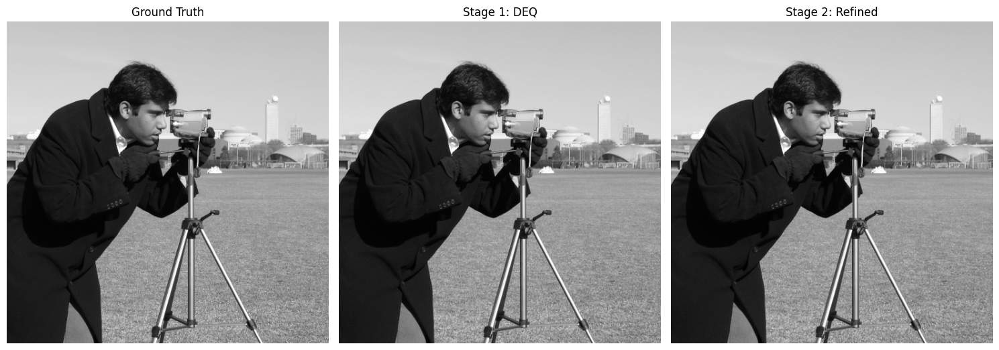

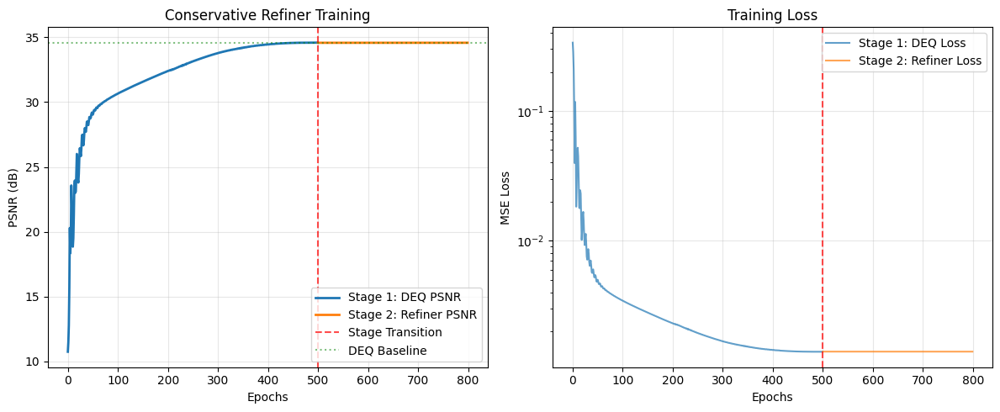


Training complete!


In [10]:
#FROZEN REFINER PHOTOGRAPHER

import numpy as np
import skimage
import skimage.data
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
from torch.nn.utils import spectral_norm
from torchdeq import get_deq
from torchdeq.norm import apply_norm, reset_norm
from torchdeq.loss import fp_correction

######################################
#
# Linear Layers
#
######################################

class INRInjection(nn.Linear):
    def __init__(self, in_features, d_hidden, scale=256):
        super().__init__(in_features, d_hidden)
        self.weight.data *= scale
        self.bias.data.uniform_(-np.pi, np.pi)

class MFNLinear(nn.Linear):
    def __init__(self, d_hidden, scale=256):
        super().__init__(d_hidden, d_hidden)
        nn.init.uniform_(self.weight, -np.sqrt(1 / d_hidden), np.sqrt(1 / d_hidden))

######################################
#
# DEQ-INR Base class
#
######################################

class DEQINRBase(nn.Module):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
                 deq_mode=True, **kwargs):
        super().__init__()
        self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
        self.mfn = nn.ModuleList([
            MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
        self.out = nn.Linear(d_hidden, d_out)
        self.d_hidden = d_hidden
        self.n_layer  = n_layer
        self.register_buffer('z_aux', self._init_z())
        self.deq_mode = deq_mode

        self.deq = get_deq(**kwargs)
        apply_norm(self.mfn, **kwargs)

    def _init_z(self):
        raise NotImplemented

    def injection(self, x):
        raise NotImplemented

    def filter(self, z, u):
        raise NotImplemented

    def mfn_forward(self, z, u):
        z = z + self.filter(self.z_aux, u[0])
        for i, layer in enumerate(self.mfn):
            z = self.filter(layer(z), u[i+1])
        return z

    def forward(self, x, z=None):
        reuse = True
        if z is None:
            z = torch.zeros(x.shape[0], self.d_hidden).to(x)
            reuse = False

        u = self.injection(x)
        reset_norm(self.mfn)
        f = lambda z: self.mfn_forward(z, u)

        if self.deq_mode:
            solver_kwargs = {'f_max_iter':0} if reuse else {}
            z_pred, info = self.deq(f, z, solver_kwargs=solver_kwargs)
        else:
            z_pred = [f(z)]

        if not isinstance(z_pred, list):
            z_pred = [z_pred]

        outputs = [self.out(z_step) for z_step in z_pred]
        return outputs, z_pred[-1]

######################################
#
# Models
#
######################################

class DEQFourierINR(DEQINRBase):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
                 deq_mode=True, **kwargs):
        super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

    def _init_z(self):
        return torch.ones(1, self.d_hidden)

    def injection(self, x):
        u = torch.sin(self.inj(x))
        u = u.chunk(self.n_layer+1, dim=1)
        return u

    def filter(self, z, u):
        return z * u

# Conservative refiner - matches DEQ scale and architecture
class ConservativeRefiner(nn.Module):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=2, scale=128.):
        super().__init__()
        # Use SAME scale as DEQ to avoid instability
        # Input is just coordinates - we'll add DEQ prediction as a skip connection
        self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
        self.mfn = nn.ModuleList([
            MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
        # Small initialization for output layer - start with near-zero residuals
        self.out = nn.Linear(d_hidden, d_out)
        nn.init.normal_(self.out.weight, std=0.001)
        nn.init.zeros_(self.out.bias)

        self.n_layer = n_layer
        self.d_hidden = d_hidden
        self.register_buffer('z_aux', torch.ones(1, d_hidden))  # Match DEQ

    def filter(self, z, u):
        # Use Fourier filter like DEQ for consistency
        return z * u

    def forward(self, x):
        # Only use coordinates, not DEQ prediction
        u = torch.sin(self.inj(x))
        u = u.chunk(self.n_layer+1, dim=1)

        z = self.filter(self.z_aux, u[0])
        for i, layer in enumerate(self.mfn):
            z = self.filter(layer(z), u[i+1])

        residual = self.out(z)
        return residual

######################################
#
# Helpers
#
######################################

def preprocess(x, normalize=False, device=None):
    if normalize:
        x = 2 * x - 1
    B, H, W, C = x.shape
    x = torch.tensor(x, device=device).float()
    return x.reshape(B*H*W, C)

def postprocess(x):
    return torch.clip((x.detach() + 1)/2, 0, 1)

def PSNR(y_orig, y_pred):
    mse = torch.mean((y_orig - y_pred) ** 2) + 1e-9
    max_pixel = 1.0
    psnr = 20 * torch.log10(max_pixel / torch.sqrt(mse))
    return psnr.item()

def load_data(img, grid_size, device=None, show_img=True):
    if img == 'astronaut':
        image = skimage.data.astronaut()
        dataset = image.reshape(1, 512, 512, 3).astype(np.float32) / 255
    else:
        image = skimage.data.camera()
        dataset = image.reshape(1, 512, 512, 1).astype(np.float32) / 255

    data_channels = dataset.shape[-1]
    RES = image.shape[1]
    full_x = np.linspace(0, 1, RES) * 2 - 1
    full_x_grid = np.stack(np.meshgrid(full_x,full_x), axis=-1)[None, :, :]

    x_train_data = full_x_grid[:, ::RES // grid_size, ::RES // grid_size]
    y_train_data = dataset[:, ::RES // grid_size, ::RES // grid_size]

    x_train = preprocess(x_train_data, device=device)
    y_train = preprocess(y_train_data, normalize=True, device=device)
    return x_train, y_train

def visualize_results(y_gt, y_deq, y_refined, grid_size=512, file_name=None):
    y_gt = postprocess(y_gt).detach().cpu().numpy()
    y_deq = postprocess(y_deq).detach().cpu().numpy()
    y_refined = postprocess(y_refined).detach().cpu().numpy()

    data_channels = y_gt.shape[-1]
    fig, ax = plt.subplots(1, 3, figsize=(15, 6))

    imgs = [y_gt, y_deq, y_refined]
    titles = ["Ground Truth", "Stage 1: DEQ", "Stage 2: Refined"]

    for i, img in enumerate(imgs):
        if data_channels == 1:
            ax[i].imshow(img.reshape(grid_size, grid_size), cmap='gray')
        else:
            ax[i].imshow(img.reshape((grid_size, grid_size, data_channels)))
        ax[i].set_title(titles[i])
        ax[i].axis('off')

    plt.tight_layout()
    if file_name:
        plt.savefig(file_name)
    plt.show()

######################################
#
# Training Loops
#
######################################

# Stage 1: Train DEQ with fp_correction (matching original approach)
def train_stage1_deq(model, x_train, y_train, epochs, lr, log_freq):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0.0)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)
    loss_log, psnr_log = [], []
    z_star = None

    model.train()
    for i in tqdm(range(epochs)):
        y_pred_list, z_pred = model(x_train, z_star)

        if model.deq_mode:
            z_star = z_pred.detach()

        # Use fp_correction like the original approach
        loss_fn = lambda y_gt, y: ((y_gt - y) ** 2).mean()
        loss = fp_correction(loss_fn, (y_train, y_pred_list))

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_pred_list[-1]))
        psnr_log.append(current_psnr)

        if (i+1) % log_freq == 0:
            print(f"[Stage 1 DEQ] Epoch {i+1} | Loss: {loss.item():.5f} | PSNR: {current_psnr:.2f}")

    return y_pred_list[-1], z_star, loss_log, psnr_log

# Stage 2: FREEZE DEQ, train only refiner
def train_stage2_frozen_deq(refiner, deq_model, x_train, y_train, epochs, lr, log_freq, warmup_epochs=50):
    """
    Keep DEQ completely frozen. Only train refiner.
    Use warmup to start with very small residuals.
    """
    optimizer = torch.optim.Adam(refiner.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)

    loss_log, psnr_log = [], []
    deq_model.eval()  # FROZEN
    refiner.train()

    # Pre-compute DEQ output once (it's frozen)
    with torch.no_grad():
        y_deq_pred, _ = deq_model(x_train)
        y_deq_pred = y_deq_pred[-1].detach()
        baseline_psnr = PSNR(postprocess(y_train), postprocess(y_deq_pred))
        print(f"DEQ Baseline PSNR: {baseline_psnr:.2f} dB")

    best_psnr = baseline_psnr
    best_state = None
    patience_counter = 0

    for i in tqdm(range(epochs)):
        # Refiner predicts residual from coordinates only
        residual = refiner(x_train)

        # Warmup: gradually increase residual magnitude
        if i < warmup_epochs:
            alpha = i / warmup_epochs
            residual = residual * alpha

        y_final = y_deq_pred + residual

        # Loss with L2 regularization on residuals
        recon_loss = ((y_train - y_final) ** 2).mean()
        reg_loss = 0.001 * (residual ** 2).mean()
        loss = recon_loss + reg_loss

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(refiner.parameters(), 0.5)  # Gentle clipping
        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_final))
        psnr_log.append(current_psnr)

        # Early stopping if PSNR degrades
        if current_psnr > best_psnr:
            best_psnr = current_psnr
            best_state = {k: v.cpu().clone() for k, v in refiner.state_dict().items()}
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter > 100:  # Stop if no improvement for 100 epochs
            print(f"\nEarly stopping at epoch {i+1}. Best PSNR: {best_psnr:.2f}")
            break

        if (i+1) % log_freq == 0:
            res_mag = residual.abs().mean().item()
            print(f"[Stage 2 Frozen] Epoch {i+1} | Loss: {loss.item():.5f} | "
                  f"PSNR: {current_psnr:.2f} | Res Mag: {res_mag:.5f} | Best: {best_psnr:.2f}")

    # Restore best model
    if best_state is not None:
        refiner.load_state_dict({k: v.to(x_train.device) for k, v in best_state.items()})
        with torch.no_grad():
            residual = refiner(x_train)
            y_final = y_deq_pred + residual

    return y_final, loss_log, psnr_log

# Stage 2 Alternative: Very conservative joint training
def train_stage2_conservative_joint(refiner, deq_model, x_train, y_train, epochs, lr_ref, lr_deq, log_freq):
    """
    Extremely conservative joint training.
    DEQ gets 100x smaller learning rate and only updates every 10 steps.
    """
    optimizer = torch.optim.Adam([
        {'params': refiner.parameters(), 'lr': lr_ref, 'weight_decay': 1e-5},
        {'params': deq_model.parameters(), 'lr': lr_deq, 'weight_decay': 0}
    ])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-7)

    loss_log, psnr_log = [], []
    deq_model.train()
    refiner.train()

    z_star = None

    with torch.no_grad():
        y_deq_init, _ = deq_model(x_train)
        baseline_psnr = PSNR(postprocess(y_train), postprocess(y_deq_init[-1]))
        print(f"Initial DEQ PSNR: {baseline_psnr:.2f} dB")

    best_psnr = baseline_psnr

    for i in tqdm(range(epochs)):
        # DEQ forward
        y_deq_pred_list, z_pred = deq_model(x_train, z_star)
        y_deq_pred = y_deq_pred_list[-1]

        if deq_model.deq_mode:
            z_star = z_pred.detach()

        # Refiner forward
        residual = refiner(x_train)
        y_final = y_deq_pred + residual

        # Loss
        recon_loss = ((y_train - y_final) ** 2).mean()
        reg_loss = 0.01 * (residual ** 2).mean()

        # DEQ should maintain its quality
        deq_loss = fp_correction(lambda y_gt, y: ((y_gt - y) ** 2).mean(), (y_train, y_deq_pred_list))

        # Combined: 90% on final output, 10% on maintaining DEQ
        loss = 0.9 * (recon_loss + reg_loss) + 0.1 * deq_loss

        optimizer.zero_grad()
        loss.backward()

        # Very gentle clipping
        torch.nn.utils.clip_grad_norm_(refiner.parameters(), 0.5)
        torch.nn.utils.clip_grad_norm_(deq_model.parameters(), 0.1)

        # Only update DEQ every 10 steps
        if i % 10 != 0:
            for param in deq_model.parameters():
                param.grad = None

        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_final))
        psnr_log.append(current_psnr)
        best_psnr = max(best_psnr, current_psnr)

        if (i+1) % log_freq == 0:
            print(f"[Stage 2 Conservative] Epoch {i+1} | Loss: {loss.item():.5f} | "
                  f"PSNR: {current_psnr:.2f} | Best: {best_psnr:.2f}")

    return y_final, loss_log, psnr_log

######################################
#
# Main Execution
#
######################################

# Configs
grid_size = 512
img = 'camera'
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

d_hidden = 256
n_layer = 3
scale = 128.
log_freq = 100

# STAGE 1 Configs
lr_deq = 1e-2
epochs_deq = 500
grad_deq = 5
norm_deq = 'spectral_norm'

# STAGE 2 Configs
lr_ref = 1e-3
epochs_ref = 300
refiner_n_layer = 2
refiner_scale = 128.  # SAME as DEQ

# Choose training mode
TRAINING_MODE = "frozen"  # Options: "frozen" or "conservative_joint"

# Load Data
print("Loading data...")
x_train, y_train = load_data(img, grid_size, device=device, show_img=False)
d_out = y_train.shape[-1]

# --- 1. Train DEQ Model ---
print("\n" + "="*60)
print("STAGE 1: Training DEQ Base Model")
print("="*60)
deq_model = DEQFourierINR(d_in=2, d_out=d_out, d_hidden=d_hidden, n_layer=n_layer, scale=scale,
                          deq_mode=True, grad=grad_deq, norm_type=norm_deq).to(device)

n_params_deq = sum(p.numel() for p in deq_model.parameters())
print(f'DEQ Model Parameters: {n_params_deq:,}')

y_deq, z_star, loss1, psnr1 = train_stage1_deq(deq_model, x_train, y_train, epochs_deq, lr_deq, log_freq)

print(f"\nStage 1 Complete! Final DEQ PSNR: {psnr1[-1]:.2f} dB")

# --- 2. Train Conservative Refiner ---
print("\n" + "="*60)
print(f"STAGE 2: Training Conservative Refiner ({TRAINING_MODE} mode)")
print("="*60)
refiner_model = ConservativeRefiner(d_in=2, d_out=d_out, d_hidden=d_hidden,
                                    n_layer=refiner_n_layer, scale=refiner_scale).to(device)

n_params_ref = sum(p.numel() for p in refiner_model.parameters())
print(f'Refiner Parameters: {n_params_ref:,}')
print(f'Total Parameters: {n_params_deq + n_params_ref:,}')

if TRAINING_MODE == "frozen":
    y_refined, loss2, psnr2 = train_stage2_frozen_deq(
        refiner_model, deq_model, x_train, y_train,
        epochs_ref, lr_ref, log_freq, warmup_epochs=50
    )
else:  # conservative_joint
    lr_deq_stage2 = lr_deq / 100  # 100x smaller
    y_refined, loss2, psnr2 = train_stage2_conservative_joint(
        refiner_model, deq_model, x_train, y_train,
        epochs_ref, lr_ref, lr_deq_stage2, log_freq
    )

# --- Results ---
print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"Final DEQ PSNR (Stage 1):     {psnr1[-1]:.2f} dB")
print(f"Final Refined PSNR (Stage 2): {psnr2[-1]:.2f} dB")
improvement = psnr2[-1] - psnr1[-1]
print(f"Improvement:                  {improvement:+.2f} dB")

if improvement < 0:
    print("\n⚠️  WARNING: Refiner decreased PSNR. This suggests:")
    print("   - The DEQ baseline is already very strong")
    print("   - The refiner may be overfitting")
    print("   - Try reducing refiner complexity or increasing regularization")

# --- Visualization ---
visualize_results(y_train, y_deq, y_refined, grid_size=grid_size, file_name='dsnr_conservative.png')

# Plot Training Curves
plt.figure(figsize=(12,5))

plt.subplot(1, 2, 1)
plt.plot(psnr1, label='Stage 1: DEQ PSNR', linewidth=2)
plt.plot(range(epochs_deq, epochs_deq+len(psnr2)), psnr2, label='Stage 2: Refiner PSNR', linewidth=2)
plt.axvline(x=epochs_deq, color='r', linestyle='--', alpha=0.7, label='Stage Transition')
plt.axhline(y=psnr1[-1], color='g', linestyle=':', alpha=0.5, label='DEQ Baseline')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.title('Conservative Refiner Training')
plt.legend()
plt.grid(alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(loss1, label='Stage 1: DEQ Loss', alpha=0.7)
plt.plot(range(epochs_deq, epochs_deq+len(loss2)), loss2, label='Stage 2: Refiner Loss', alpha=0.7)
plt.axvline(x=epochs_deq, color='r', linestyle='--', alpha=0.7)
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Training Loss')
plt.legend()
plt.grid(alpha=0.3)
plt.yscale('log')

plt.tight_layout()
plt.savefig('dsnr_conservative_curves.png')
plt.show()

print("\nTraining complete!")

In [12]:
'''
#CONSERVATIVE JOINT REFINER PHOTOGRAPHER

import numpy as np
import skimage
import skimage.data
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn as nn
from torch.nn.utils import spectral_norm
from torchdeq import get_deq
from torchdeq.norm import apply_norm, reset_norm
from torchdeq.loss import fp_correction

######################################
#
# Linear Layers
#
######################################

class INRInjection(nn.Linear):
    def __init__(self, in_features, d_hidden, scale=256):
        super().__init__(in_features, d_hidden)
        self.weight.data *= scale
        self.bias.data.uniform_(-np.pi, np.pi)

class MFNLinear(nn.Linear):
    def __init__(self, d_hidden, scale=256):
        super().__init__(d_hidden, d_hidden)
        nn.init.uniform_(self.weight, -np.sqrt(1 / d_hidden), np.sqrt(1 / d_hidden))

######################################
#
# DEQ-INR Base class
#
######################################

class DEQINRBase(nn.Module):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
                 deq_mode=True, **kwargs):
        super().__init__()
        self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
        self.mfn = nn.ModuleList([
            MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
        self.out = nn.Linear(d_hidden, d_out)
        self.d_hidden = d_hidden
        self.n_layer  = n_layer
        self.register_buffer('z_aux', self._init_z())
        self.deq_mode = deq_mode

        self.deq = get_deq(**kwargs)
        apply_norm(self.mfn, **kwargs)

    def _init_z(self):
        raise NotImplemented

    def injection(self, x):
        raise NotImplemented

    def filter(self, z, u):
        raise NotImplemented

    def mfn_forward(self, z, u):
        z = z + self.filter(self.z_aux, u[0])
        for i, layer in enumerate(self.mfn):
            z = self.filter(layer(z), u[i+1])
        return z

    def forward(self, x, z=None):
        reuse = True
        if z is None:
            z = torch.zeros(x.shape[0], self.d_hidden).to(x)
            reuse = False

        u = self.injection(x)
        reset_norm(self.mfn)
        f = lambda z: self.mfn_forward(z, u)

        if self.deq_mode:
            solver_kwargs = {'f_max_iter':0} if reuse else {}
            z_pred, info = self.deq(f, z, solver_kwargs=solver_kwargs)
        else:
            z_pred = [f(z)]

        if not isinstance(z_pred, list):
            z_pred = [z_pred]

        outputs = [self.out(z_step) for z_step in z_pred]
        return outputs, z_pred[-1]

######################################
#
# Models
#
######################################

class DEQFourierINR(DEQINRBase):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=1, scale=256.,
                 deq_mode=True, **kwargs):
        super().__init__(d_in, d_out, d_hidden, n_layer, scale, deq_mode, **kwargs)

    def _init_z(self):
        return torch.ones(1, self.d_hidden)

    def injection(self, x):
        u = torch.sin(self.inj(x))
        u = u.chunk(self.n_layer+1, dim=1)
        return u

    def filter(self, z, u):
        return z * u

# Conservative refiner - matches DEQ scale and architecture
class ConservativeRefiner(nn.Module):
    def __init__(self, d_in=2, d_out=3, d_hidden=128, n_layer=2, scale=128.):
        super().__init__()
        # Use SAME scale as DEQ to avoid instability
        # Input is just coordinates - we'll add DEQ prediction as a skip connection
        self.inj = INRInjection(d_in, d_hidden*(n_layer+1), scale=scale)
        self.mfn = nn.ModuleList([
            MFNLinear(d_hidden, d_hidden) for _ in range(n_layer)
        ])
        # Small initialization for output layer - start with near-zero residuals
        self.out = nn.Linear(d_hidden, d_out)
        nn.init.normal_(self.out.weight, std=0.001)
        nn.init.zeros_(self.out.bias)

        self.n_layer = n_layer
        self.d_hidden = d_hidden
        self.register_buffer('z_aux', torch.ones(1, d_hidden))  # Match DEQ

    def filter(self, z, u):
        # Use Fourier filter like DEQ for consistency
        return z * u

    def forward(self, x):
        # Only use coordinates, not DEQ prediction
        u = torch.sin(self.inj(x))
        u = u.chunk(self.n_layer+1, dim=1)

        z = self.filter(self.z_aux, u[0])
        for i, layer in enumerate(self.mfn):
            z = self.filter(layer(z), u[i+1])

        residual = self.out(z)
        return residual

######################################
#
# Helpers
#
######################################

def preprocess(x, normalize=False, device=None):
    if normalize:
        x = 2 * x - 1
    B, H, W, C = x.shape
    x = torch.tensor(x, device=device).float()
    return x.reshape(B*H*W, C)

def postprocess(x):
    return torch.clip((x.detach() + 1)/2, 0, 1)

def PSNR(y_orig, y_pred):
    mse = torch.mean((y_orig - y_pred) ** 2) + 1e-9
    max_pixel = 1.0
    psnr = 20 * torch.log10(max_pixel / torch.sqrt(mse))
    return psnr.item()

def load_data(img, grid_size, device=None, show_img=True):
    if img == 'astronaut':
        image = skimage.data.astronaut()
        dataset = image.reshape(1, 512, 512, 3).astype(np.float32) / 255
    else:
        image = skimage.data.camera()
        dataset = image.reshape(1, 512, 512, 1).astype(np.float32) / 255

    data_channels = dataset.shape[-1]
    RES = image.shape[1]
    full_x = np.linspace(0, 1, RES) * 2 - 1
    full_x_grid = np.stack(np.meshgrid(full_x,full_x), axis=-1)[None, :, :]

    x_train_data = full_x_grid[:, ::RES // grid_size, ::RES // grid_size]
    y_train_data = dataset[:, ::RES // grid_size, ::RES // grid_size]

    x_train = preprocess(x_train_data, device=device)
    y_train = preprocess(y_train_data, normalize=True, device=device)
    return x_train, y_train

def visualize_results(y_gt, y_deq, y_refined, grid_size=512, file_name=None):
    y_gt = postprocess(y_gt).detach().cpu().numpy()
    y_deq = postprocess(y_deq).detach().cpu().numpy()
    y_refined = postprocess(y_refined).detach().cpu().numpy()

    data_channels = y_gt.shape[-1]
    fig, ax = plt.subplots(1, 3, figsize=(15, 6))

    imgs = [y_gt, y_deq, y_refined]
    titles = ["Ground Truth", "Stage 1: DEQ", "Stage 2: Refined"]

    for i, img in enumerate(imgs):
        if data_channels == 1:
            ax[i].imshow(img.reshape(grid_size, grid_size), cmap='gray')
        else:
            ax[i].imshow(img.reshape((grid_size, grid_size, data_channels)))
        ax[i].set_title(titles[i])
        ax[i].axis('off')

    plt.tight_layout()
    if file_name:
        plt.savefig(file_name)
    plt.show()

######################################
#
# Training Loops
#
######################################

# Stage 1: Train DEQ with fp_correction (matching original approach)
def train_stage1_deq(model, x_train, y_train, epochs, lr, log_freq):
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0.0)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)
    loss_log, psnr_log = [], []
    z_star = None

    model.train()
    for i in tqdm(range(epochs)):
        y_pred_list, z_pred = model(x_train, z_star)

        if model.deq_mode:
            z_star = z_pred.detach()

        # Use fp_correction like the original approach
        loss_fn = lambda y_gt, y: ((y_gt - y) ** 2).mean()
        loss = fp_correction(loss_fn, (y_train, y_pred_list))

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_pred_list[-1]))
        psnr_log.append(current_psnr)

        if (i+1) % log_freq == 0:
            print(f"[Stage 1 DEQ] Epoch {i+1} | Loss: {loss.item():.5f} | PSNR: {current_psnr:.2f}")

    return y_pred_list[-1], z_star, loss_log, psnr_log

# Stage 2: FREEZE DEQ, train only refiner
def train_stage2_frozen_deq(refiner, deq_model, x_train, y_train, epochs, lr, log_freq, warmup_epochs=50):
    """
    Keep DEQ completely frozen. Only train refiner.
    Use warmup to start with very small residuals.
    """
    optimizer = torch.optim.Adam(refiner.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-6)

    loss_log, psnr_log = [], []
    deq_model.eval()  # FROZEN
    refiner.train()

    # Pre-compute DEQ output once (it's frozen)
    with torch.no_grad():
        y_deq_pred, _ = deq_model(x_train)
        y_deq_pred = y_deq_pred[-1].detach()
        baseline_psnr = PSNR(postprocess(y_train), postprocess(y_deq_pred))
        print(f"DEQ Baseline PSNR: {baseline_psnr:.2f} dB")

    best_psnr = baseline_psnr
    best_state = None
    patience_counter = 0

    for i in tqdm(range(epochs)):
        # Refiner predicts residual from coordinates only
        residual = refiner(x_train)

        # Warmup: gradually increase residual magnitude
        if i < warmup_epochs:
            alpha = i / warmup_epochs
            residual = residual * alpha

        y_final = y_deq_pred + residual

        # Loss with L2 regularization on residuals
        recon_loss = ((y_train - y_final) ** 2).mean()
        reg_loss = 0.001 * (residual ** 2).mean()
        loss = recon_loss + reg_loss

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(refiner.parameters(), 0.5)  # Gentle clipping
        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_final))
        psnr_log.append(current_psnr)

        # Early stopping if PSNR degrades
        if current_psnr > best_psnr:
            best_psnr = current_psnr
            best_state = {k: v.cpu().clone() for k, v in refiner.state_dict().items()}
            patience_counter = 0
        else:
            patience_counter += 1

        if patience_counter > 100:  # Stop if no improvement for 100 epochs
            print(f"\nEarly stopping at epoch {i+1}. Best PSNR: {best_psnr:.2f}")
            break

        if (i+1) % log_freq == 0:
            res_mag = residual.abs().mean().item()
            print(f"[Stage 2 Frozen] Epoch {i+1} | Loss: {loss.item():.5f} | "
                  f"PSNR: {current_psnr:.2f} | Res Mag: {res_mag:.5f} | Best: {best_psnr:.2f}")

    # Restore best model
    if best_state is not None:
        refiner.load_state_dict({k: v.to(x_train.device) for k, v in best_state.items()})
        with torch.no_grad():
            residual = refiner(x_train)
            y_final = y_deq_pred + residual

    return y_final, loss_log, psnr_log

# Stage 2 Alternative: Very conservative joint training
def train_stage2_conservative_joint(refiner, deq_model, x_train, y_train, epochs, lr_ref, lr_deq, log_freq):
    """
    Extremely conservative joint training.
    DEQ gets 100x smaller learning rate and only updates every 10 steps.
    """
    optimizer = torch.optim.Adam([
        {'params': refiner.parameters(), 'lr': lr_ref, 'weight_decay': 1e-5},
        {'params': deq_model.parameters(), 'lr': lr_deq, 'weight_decay': 0}
    ])
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, eta_min=1e-7)

    loss_log, psnr_log = [], []
    deq_model.train()
    refiner.train()

    z_star = None

    with torch.no_grad():
        y_deq_init, _ = deq_model(x_train)
        baseline_psnr = PSNR(postprocess(y_train), postprocess(y_deq_init[-1]))
        print(f"Initial DEQ PSNR: {baseline_psnr:.2f} dB")

    best_psnr = baseline_psnr

    for i in tqdm(range(epochs)):
        # DEQ forward
        y_deq_pred_list, z_pred = deq_model(x_train, z_star)
        y_deq_pred = y_deq_pred_list[-1]

        if deq_model.deq_mode:
            z_star = z_pred.detach()

        # Refiner forward
        residual = refiner(x_train)
        y_final = y_deq_pred + residual

        # Loss
        recon_loss = ((y_train - y_final) ** 2).mean()
        reg_loss = 0.01 * (residual ** 2).mean()

        # DEQ should maintain its quality
        deq_loss = fp_correction(lambda y_gt, y: ((y_gt - y) ** 2).mean(), (y_train, y_deq_pred_list))

        # Combined: 90% on final output, 10% on maintaining DEQ
        loss = 0.9 * (recon_loss + reg_loss) + 0.1 * deq_loss

        optimizer.zero_grad()
        loss.backward()

        # Very gentle clipping
        torch.nn.utils.clip_grad_norm_(refiner.parameters(), 0.5)
        torch.nn.utils.clip_grad_norm_(deq_model.parameters(), 0.1)

        # Only update DEQ every 10 steps
        if i % 10 != 0:
            for param in deq_model.parameters():
                param.grad = None

        optimizer.step()
        scheduler.step()

        loss_log.append(loss.item())
        current_psnr = PSNR(postprocess(y_train), postprocess(y_final))
        psnr_log.append(current_psnr)
        best_psnr = max(best_psnr, current_psnr)

        if (i+1) % log_freq == 0:
            print(f"[Stage 2 Conservative] Epoch {i+1} | Loss: {loss.item():.5f} | "
                  f"PSNR: {current_psnr:.2f} | Best: {best_psnr:.2f}")

    return y_final, loss_log, psnr_log

######################################
#
# Main Execution
#
######################################

# Configs
grid_size = 512
img = 'camera'
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

d_hidden = 256
n_layer = 3
scale = 128.
log_freq = 100

# STAGE 1 Configs
lr_deq = 1e-2
epochs_deq = 500
grad_deq = 5
norm_deq = 'spectral_norm'

# STAGE 2 Configs
lr_ref = 1e-3
epochs_ref = 300
refiner_n_layer = 2
refiner_scale = 128.  # SAME as DEQ

# Choose training mode
TRAINING_MODE = "conservative_joint"  # Options: "frozen" or "conservative_joint"

# Load Data
print("Loading data...")
x_train, y_train = load_data(img, grid_size, device=device, show_img=False)
d_out = y_train.shape[-1]

# --- 1. Train DEQ Model ---
print("\n" + "="*60)
print("STAGE 1: Training DEQ Base Model")
print("="*60)
deq_model = DEQFourierINR(d_in=2, d_out=d_out, d_hidden=d_hidden, n_layer=n_layer, scale=scale,
                          deq_mode=True, grad=grad_deq, norm_type=norm_deq).to(device)

n_params_deq = sum(p.numel() for p in deq_model.parameters())
print(f'DEQ Model Parameters: {n_params_deq:,}')

y_deq, z_star, loss1, psnr1 = train_stage1_deq(deq_model, x_train, y_train, epochs_deq, lr_deq, log_freq)

print(f"\nStage 1 Complete! Final DEQ PSNR: {psnr1[-1]:.2f} dB")

# --- 2. Train Conservative Refiner ---
print("\n" + "="*60)
print(f"STAGE 2: Training Conservative Refiner ({TRAINING_MODE} mode)")
print("="*60)
refiner_model = ConservativeRefiner(d_in=2, d_out=d_out, d_hidden=d_hidden,
                                    n_layer=refiner_n_layer, scale=refiner_scale).to(device)

n_params_ref = sum(p.numel() for p in refiner_model.parameters())
print(f'Refiner Parameters: {n_params_ref:,}')
print(f'Total Parameters: {n_params_deq + n_params_ref:,}')

if TRAINING_MODE == "frozen":
    y_refined, loss2, psnr2 = train_stage2_frozen_deq(
        refiner_model, deq_model, x_train, y_train,
        epochs_ref, lr_ref, log_freq, warmup_epochs=50
    )
else:  # conservative_joint
    lr_deq_stage2 = lr_deq / 100  # 100x smaller
    y_refined, loss2, psnr2 = train_stage2_conservative_joint(
        refiner_model, deq_model, x_train, y_train,
        epochs_ref, lr_ref, lr_deq_stage2, log_freq
    )

# --- Results ---
print("\n" + "="*60)
print("FINAL RESULTS")
print("="*60)
print(f"Final DEQ PSNR (Stage 1):     {psnr1[-1]:.2f} dB")
print(f"Final Refined PSNR (Stage 2): {psnr2[-1]:.2f} dB")
improvement = psnr2[-1] - psnr1[-1]
print(f"Improvement:                  {improvement:+.2f} dB")

if improvement < 0:
    print("\n⚠️  WARNING: Refiner decreased PSNR. This suggests:")
    print("   - The DEQ baseline is already very strong")
    print("   - The refiner may be overfitting")
    print("   - Try reducing refiner complexity or increasing regularization")

# --- Visualization ---
visualize_results(y_train, y_deq, y_refined, grid_size=grid_size, file_name='dsnr_conservative.png')

# Plot Training Curves
plt.figure(figsize=(12,5))

plt.subplot(1, 2, 1)
plt.plot(psnr1, label='Stage 1: DEQ PSNR', linewidth=2)
plt.plot(range(epochs_deq, epochs_deq+len(psnr2)), psnr2, label='Stage 2: Refiner PSNR', linewidth=2)
plt.axvline(x=epochs_deq, color='r', linestyle='--', alpha=0.7, label='Stage Transition')
plt.axhline(y=psnr1[-1], color='g', linestyle=':', alpha=0.5, label='DEQ Baseline')
plt.xlabel('Epochs')
plt.ylabel('PSNR (dB)')
plt.title('Conservative Refiner Training')
plt.legend()
plt.grid(alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(loss1, label='Stage 1: DEQ Loss', alpha=0.7)
plt.plot(range(epochs_deq, epochs_deq+len(loss2)), loss2, label='Stage 2: Refiner Loss', alpha=0.7)
plt.axvline(x=epochs_deq, color='r', linestyle='--', alpha=0.7)
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Training Loss')
plt.legend()
plt.grid(alpha=0.3)
plt.yscale('log')

plt.tight_layout()
plt.savefig('dsnr_conservative_curves.png')
plt.show()

print("\nTraining complete!")
'''

Loading data...

STAGE 1: Training DEQ Base Model
DEQ Model Parameters: 200,705


  0%|          | 0/500 [00:00<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 256.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 54.12 MiB is free. Process 23181 has 14.69 GiB memory in use. Of the allocated memory 14.31 GiB is allocated by PyTorch, and 251.27 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

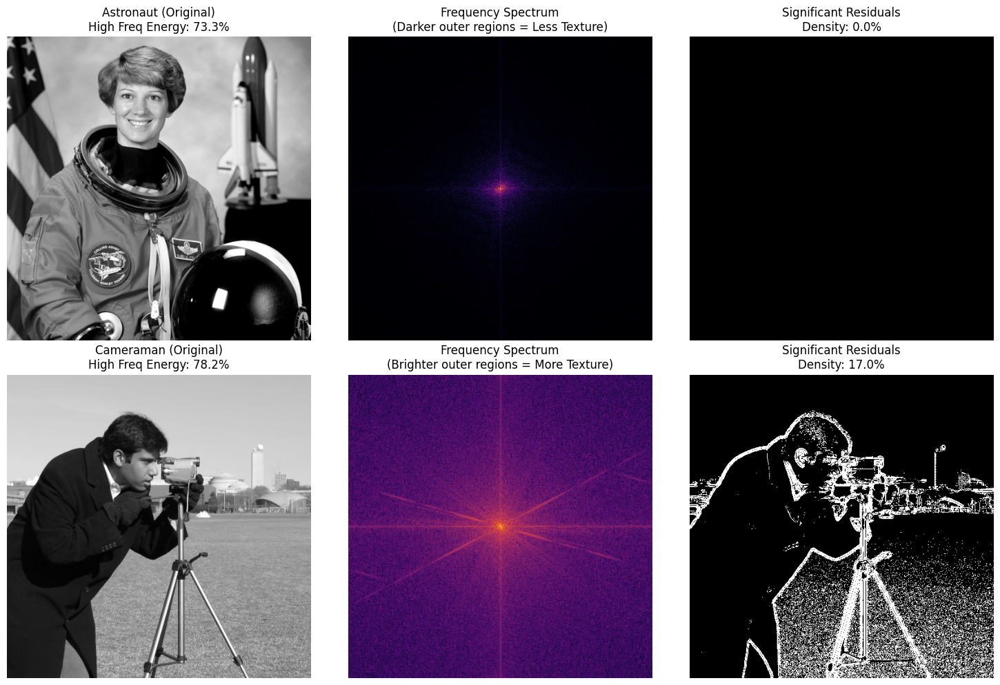

In [5]:
import numpy as np
import skimage.data
import skimage.color
import scipy.fftpack
import scipy.ndimage
import matplotlib.pyplot as plt

def get_image_data(name):
    """Loads and standardizes images to 512x512 Grayscale"""
    if name == 'astronaut':
        img = skimage.data.astronaut()
        img = skimage.color.rgb2gray(img)
    elif name == 'camera':
        img = skimage.data.camera()

    # Resize to 512x512 for fair comparison if necessary (both are 512 natively)
    img = img / 255.0  # Normalize to [0, 1]
    return img

def analyze_frequency_and_residuals(img_name):
    img = get_image_data(img_name)

    # --- TEST 1: FREQUENCY ANALYSIS (FFT) ---
    # Compute the 2D Fast Fourier Transform
    f_transform = scipy.fftpack.fft2(img)
    f_shift = scipy.fftpack.fftshift(f_transform)
    magnitude_spectrum = np.abs(f_shift)

    # Calculate Total Energy
    total_energy = np.sum(magnitude_spectrum)

    # Mask out the low frequencies (center of the spectrum)
    rows, cols = img.shape
    crow, ccol = rows // 2, cols // 2
    radius = 30  # Define what counts as "Low Frequency"

    # Create a mask
    y, x = np.ogrid[:rows, :cols]
    mask_area = (x - ccol)**2 + (y - crow)**2 <= radius**2

    # Energy in Low Frequencies (Center)
    low_freq_energy = np.sum(magnitude_spectrum[mask_area])

    # Energy in High Frequencies (Outside Center)
    high_freq_energy = total_energy - low_freq_energy
    high_freq_ratio = high_freq_energy / total_energy

    # --- TEST 2: RESIDUAL DENSITY ---
    # Simulate a "Smooth" DEQ Baseline using a Low-Pass Filter (Gaussian)
    # This represents the DEQ capturing structure but missing texture.
    deq_proxy = scipy.ndimage.gaussian_filter(img, sigma=2.0)

    # Calculate the Residual (The "Error" signal)
    residual = np.abs(img - deq_proxy)

    # Define "Active" Residuals (Pixels with significant error)
    # Threshold: error > 5% pixel intensity
    threshold = 0.05
    active_pixels = np.sum(residual > threshold)
    total_pixels = img.size
    residual_density = active_pixels / total_pixels

    return {
        "image": img,
        "spectrum": np.log(1 + magnitude_spectrum), # Log for visualization
        "residual": residual,
        "high_freq_ratio": high_freq_ratio,
        "residual_density": residual_density
    }

# Run Analysis
astro_stats = analyze_frequency_and_residuals('astronaut')
cam_stats = analyze_frequency_and_residuals('camera')

# --- VISUALIZATION ---
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Plot Astronaut
axes[0, 0].imshow(astro_stats['image'], cmap='gray')
axes[0, 0].set_title(f"Astronaut (Original)\nHigh Freq Energy: {astro_stats['high_freq_ratio']:.1%}")

axes[0, 1].imshow(astro_stats['spectrum'], cmap='inferno')
axes[0, 1].set_title("Frequency Spectrum\n(Darker outer regions = Less Texture)")

axes[0, 2].imshow(astro_stats['residual'] > 0.05, cmap='gray')
axes[0, 2].set_title(f"Significant Residuals\nDensity: {astro_stats['residual_density']:.1%}")

# Plot Cameraman
axes[1, 0].imshow(cam_stats['image'], cmap='gray')
axes[1, 0].set_title(f"Cameraman (Original)\nHigh Freq Energy: {cam_stats['high_freq_ratio']:.1%}")

axes[1, 1].imshow(cam_stats['spectrum'], cmap='inferno')
axes[1, 1].set_title("Frequency Spectrum\n(Brighter outer regions = More Texture)")

axes[1, 2].imshow(cam_stats['residual'] > 0.05, cmap='gray')
axes[1, 2].set_title(f"Significant Residuals\nDensity: {cam_stats['residual_density']:.1%}")

for ax in axes.flatten():
    ax.axis('off')

plt.tight_layout()
plt.show()